In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import obspy
from os.path import join
%matplotlib inline

In [3]:
df=pd.read_csv("./misfit_withsnr.csv",index_col=0)

In [4]:
df

,gcmtid,depth,process_flag,p_z,p_r,s_z,s_r,s_t,surf_z,surf_r,surf_z_mt,surf_r_mt,p_all,sv_all,sh_all,ray_all,theall
0,200708020237A,d-10,preprocessed_10s_to_120s,1.943146e-05,2.028504e-05,5.890979e-05,0.000070,0.000097,4.305773e-05,3.757723e-05,0.457184,0.399612,1.985825e-05,6.468416e-05,0.000097,4.031748e-05,5.553370e-05
1,200708020237A,d-10,preprocessed_20s_to_120s,1.210708e-05,1.409996e-05,3.290281e-05,0.000054,0.000070,1.992747e-05,1.395459e-05,0.333591,0.218876,1.310352e-05,4.332086e-05,0.000070,1.694103e-05,3.574951e-05
2,200708020237A,d-10,preprocessed_40s_to_120s,6.022930e-06,6.395815e-06,1.685350e-05,0.000023,0.000031,4.748284e-06,3.995500e-06,0.238406,0.210838,6.209372e-06,1.972104e-05,0.000031,4.371892e-06,1.525541e-05
3,200708020237A,d-15,preprocessed_10s_to_120s,2.020904e-05,2.102643e-05,6.225673e-05,0.000071,0.000096,4.748660e-05,4.009890e-05,0.507248,0.419871,2.061774e-05,6.643970e-05,0.000096,4.379275e-05,5.670954e-05
4,200708020237A,d-15,preprocessed_20s_to_120s,1.202542e-05,1.459977e-05,3.316391e-05,0.000054,0.000069,1.961520e-05,1.401399e-05,0.343910,0.231724,1.331259e-05,4.357484e-05,0.000069,1.681459e-05,3.556240e-05
5,200708020237A,d-15,preprocessed_40s_to_120s,6.076990e-06,6.414456e-06,1.578945e-05,0.000022,0.000031,4.446705e-06,3.778247e-06,0.222603,0.196632,6.245723e-06,1.890473e-05,0.000031,4.112476e-06,1.500777e-05
6,200708020237A,d-5,preprocessed_10s_to_120s,1.882439e-05,1.981437e-05,5.691841e-05,0.000071,0.000099,4.244856e-05,3.702532e-05,0.425883,0.385595,1.931938e-05,6.399666e-05,0.000099,3.973694e-05,5.543672e-05
7,200708020237A,d-5,preprocessed_20s_to_120s,1.228513e-05,1.352563e-05,3.457884e-05,0.000054,0.000071,2.098417e-05,1.449037e-05,0.341240,0.226944,1.290538e-05,4.447867e-05,0.000071,1.773727e-05,3.642687e-05
8,200708020237A,d-5,preprocessed_40s_to_120s,5.973459e-06,6.429658e-06,1.859123e-05,0.000024,0.000031,5.152133e-06,4.303943e-06,0.258098,0.231167,6.201558e-06,2.107933e-05,0.000031,4.728038e-06,1.566114e-05
9,200708020237A,d0,preprocessed_10s_to_120s,1.915812e-05,1.947108e-05,5.622004e-05,0.000073,0.000100,4.493939e-05,3.914860e-05,0.425310,0.380569,1.931460e-05,6.470677e-05,0.000100,4.204400e-05,5.639720e-05


In [5]:
cmt_dir="/Users/ziyixi/work/seismic-code/fwi-script/visualize/data/cmts"
depth_mapper={}
gcmtid_keys=set(df.gcmtid)
gcmtid_keys=sorted(gcmtid_keys)
for gcmtid in gcmtid_keys:
    depth_mapper[gcmtid]=obspy.read_events(join(cmt_dir,gcmtid))[0].origins[0].depth/1000

In [6]:
depth_range=[-15,-10,-5,0,5,10,15]

In [7]:
def plot_single_figure(gcmtid,process_flag):
    depth=depth_mapper[gcmtid]
    x_perdep=depth_range
    x_acdep=[]
    if(depth<20):
        x_acdep=list(np.linspace(5,depth,4))+[depth+5,depth+10,depth+15]
    else:
        x_acdep=[depth-15,depth-10,depth-5,depth,depth+5,depth+10,depth+15]
    y_p_z,y_p_r,y_s_z,y_s_r,y_s_t,y_surf_z,y_surf_r,y_surf_z_mt,y_surf_r_mt=[[] for i in range(9)]
    y_p_all,y_sv_all,y_sh_all,y_ray_all,y_theall,y_bodyall=[],[],[],[],[],[]
    df_gcmtid=df[df.gcmtid==gcmtid]
    df_gcmtid_processflag=df_gcmtid[df_gcmtid.process_flag==process_flag]
    for thedepth in depth_range:
        depth_name=f"d{thedepth}"
        df_gcmtid_processflag_depth=df_gcmtid_processflag[df_gcmtid_processflag.depth==depth_name]
        thedf=df_gcmtid_processflag_depth
        y_p_all.append(thedf.p_all.values[0])
        y_sv_all.append(thedf.sv_all.values[0])
        y_sh_all.append(thedf.sh_all.values[0])
        y_ray_all.append(thedf.ray_all.values[0])
        y_theall.append(thedf.theall.values[0])
        y_bodyall=[(y_p_all[i]+y_sv_all[i]+y_sh_all[i])/3 for i in range(len(y_p_all))]
        
        y_p_z.append(thedf.p_z.values[0])
        y_p_r.append(thedf.p_r.values[0])
        y_s_z.append(thedf.s_z.values[0])
        y_s_r.append(thedf.s_r.values[0])
        y_s_t.append(thedf.s_t.values[0])
        y_surf_z.append(thedf.surf_z.values[0])
        y_surf_r.append(thedf.surf_r.values[0])
        y_surf_z_mt.append(thedf.surf_z_mt.values[0])
        y_surf_r_mt.append(thedf.surf_r_mt.values[0])
    plt.figure(figsize=(14,6))
    plot_list=[y_p_z,y_p_r,y_s_z,y_s_r,y_s_t,
              y_surf_z,y_surf_r,y_surf_z_mt,y_surf_r_mt,y_p_all,
              y_sv_all,y_sh_all,y_ray_all,y_theall,y_bodyall]
    plot_name=["p_z","p_r","s_z","s_r","s_t",
              "surf_z","surf_r","surf_z_mt","surf_r_mt","p_all",
              "sv_all","sh_all","ray_all","theall","bodyall"]
    for index,they in enumerate(plot_list):
        ax=plt.subplot(3,5,index+1)
        ax.plot(x_perdep,they,color="k")
        ax.scatter(x_perdep,they,color="r")
        ax.set_title(plot_name[index])
    plt.suptitle(f"{gcmtid},{depth}")
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()
    xticks=[f"d{i}({j})" for i,j in zip(x_perdep,x_acdep)]                 
    print(xticks)

### 20s case

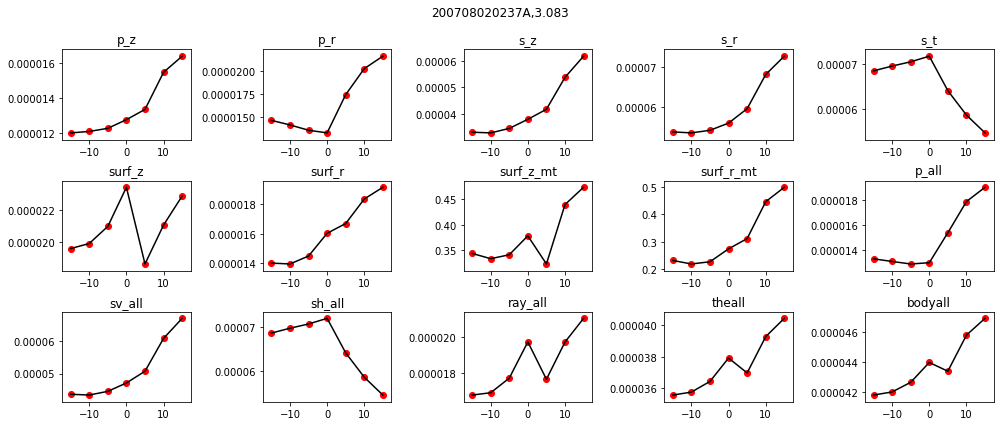

['d-15(5.0)', 'd-10(4.361)', 'd-5(3.7220000000000004)', 'd0(3.083)', 'd5(8.083)', 'd10(13.083)', 'd15(18.083)']


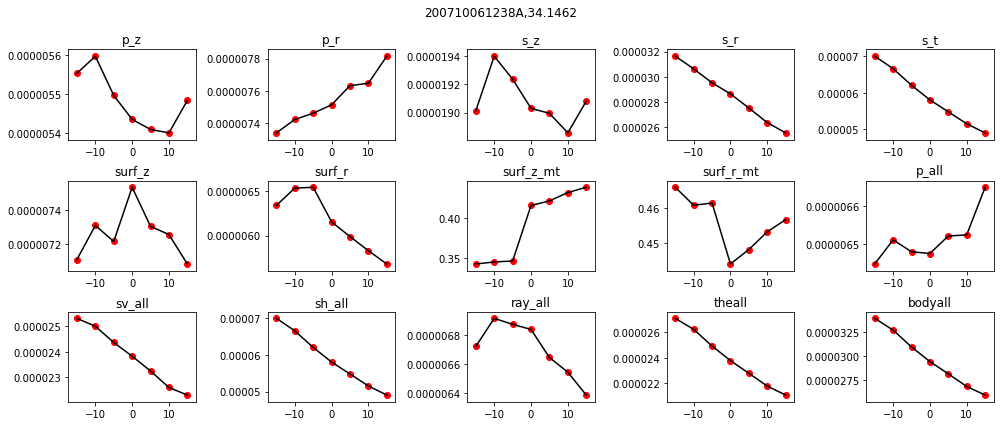

['d-15(19.1462)', 'd-10(24.1462)', 'd-5(29.1462)', 'd0(34.1462)', 'd5(39.1462)', 'd10(44.1462)', 'd15(49.1462)']


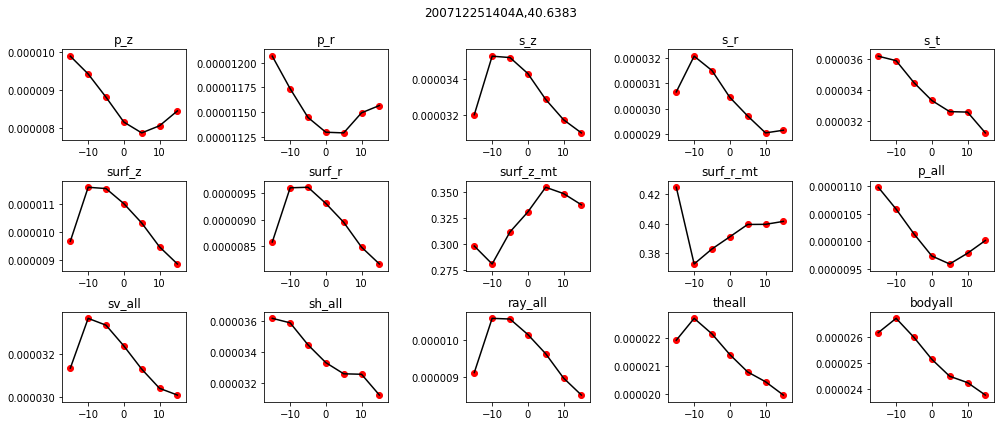

['d-15(25.6383)', 'd-10(30.6383)', 'd-5(35.6383)', 'd0(40.6383)', 'd5(45.6383)', 'd10(50.6383)', 'd15(55.6383)']


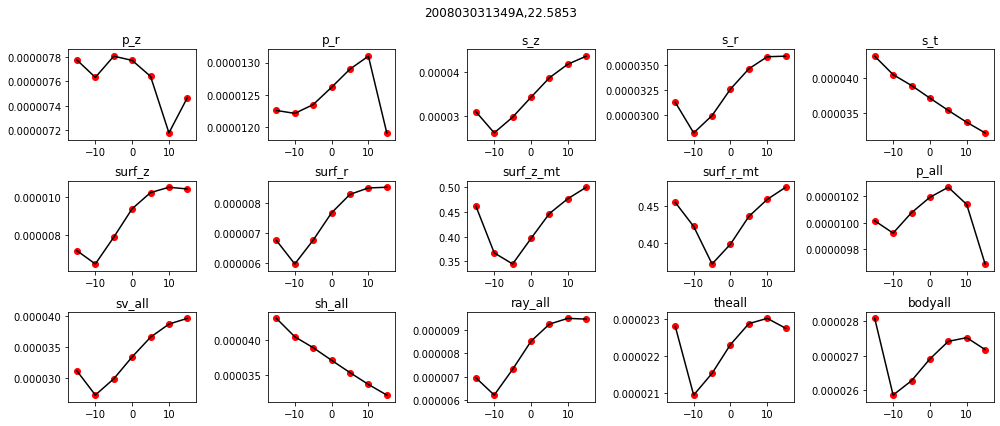

['d-15(7.5853)', 'd-10(12.5853)', 'd-5(17.5853)', 'd0(22.5853)', 'd5(27.5853)', 'd10(32.585300000000004)', 'd15(37.585300000000004)']


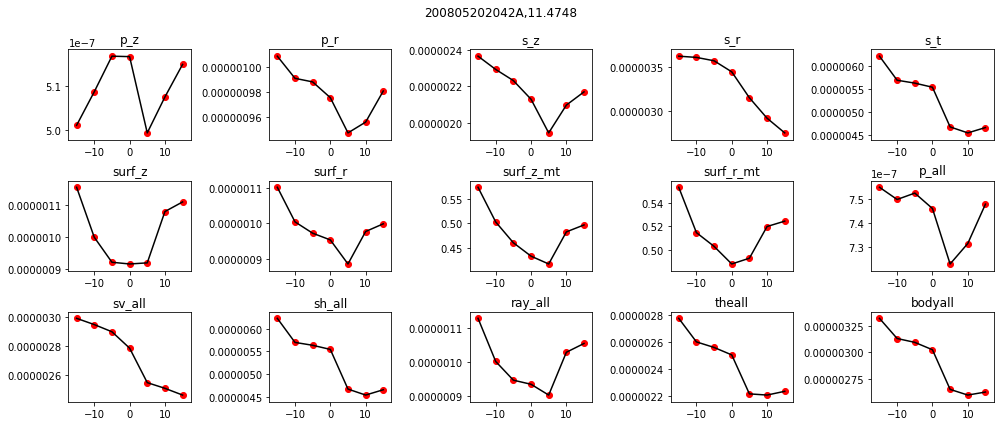

['d-15(5.0)', 'd-10(7.158266666666666)', 'd-5(9.316533333333332)', 'd0(11.4748)', 'd5(16.474800000000002)', 'd10(21.474800000000002)', 'd15(26.474800000000002)']


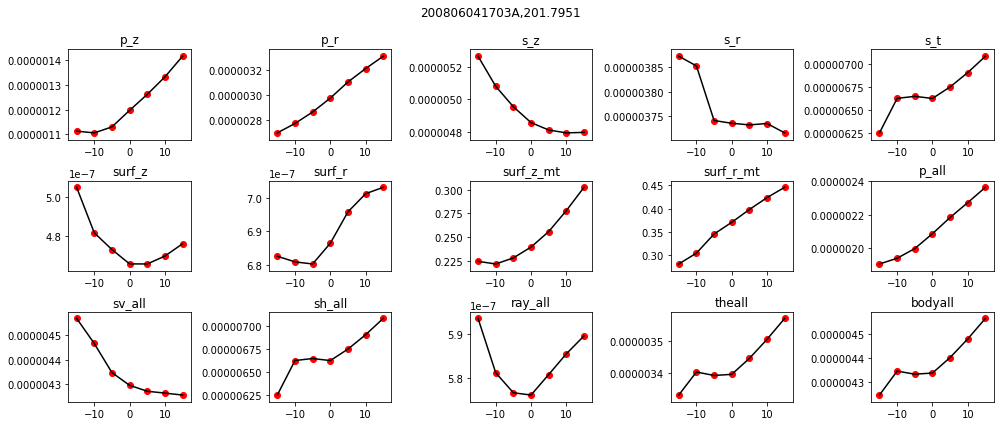

['d-15(186.7951)', 'd-10(191.7951)', 'd-5(196.7951)', 'd0(201.7951)', 'd5(206.7951)', 'd10(211.7951)', 'd15(216.7951)']


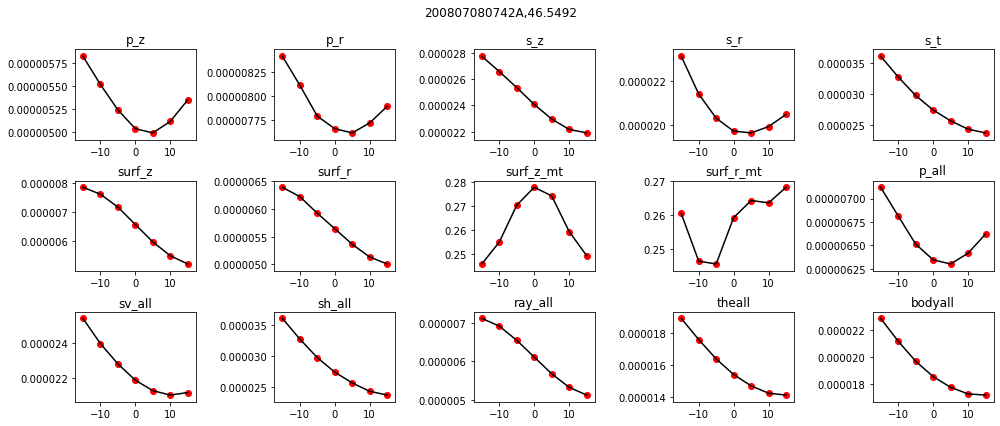

['d-15(31.5492)', 'd-10(36.5492)', 'd-5(41.5492)', 'd0(46.5492)', 'd5(51.5492)', 'd10(56.5492)', 'd15(61.5492)']


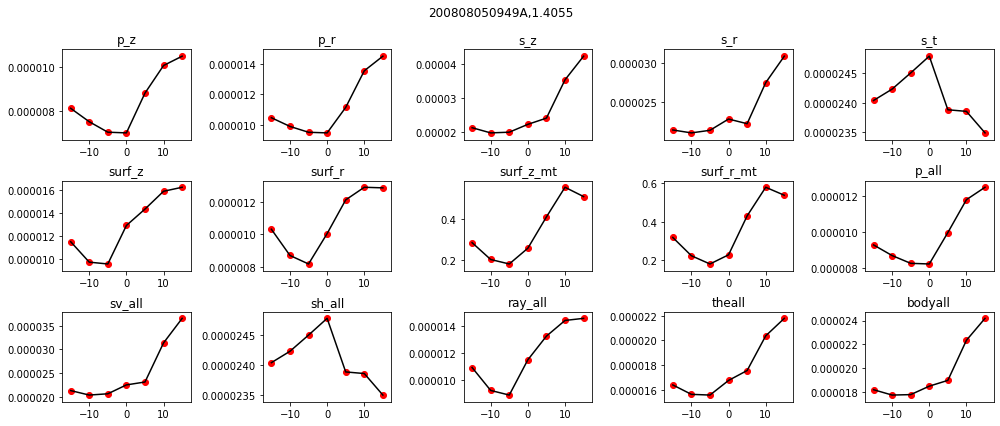

['d-15(5.0)', 'd-10(3.8018333333333336)', 'd-5(2.603666666666667)', 'd0(1.4055)', 'd5(6.4055)', 'd10(11.4055)', 'd15(16.4055)']


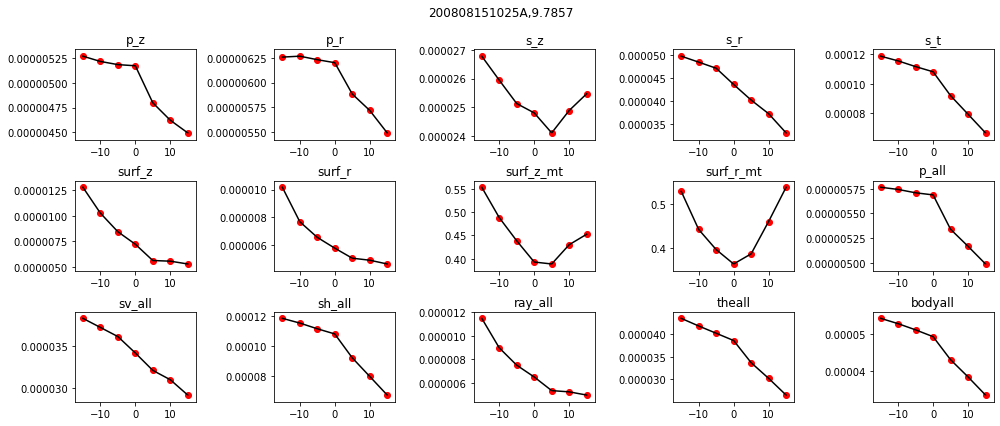

['d-15(5.0)', 'd-10(6.595233333333334)', 'd-5(8.190466666666667)', 'd0(9.7857)', 'd5(14.7857)', 'd10(19.7857)', 'd15(24.7857)']


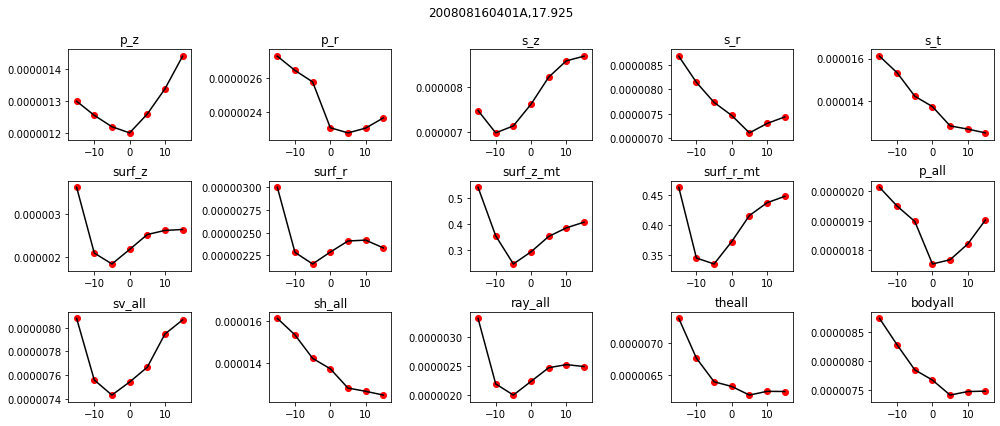

['d-15(5.0)', 'd-10(9.308333333333334)', 'd-5(13.616666666666667)', 'd0(17.925)', 'd5(22.925)', 'd10(27.925)', 'd15(32.925)']


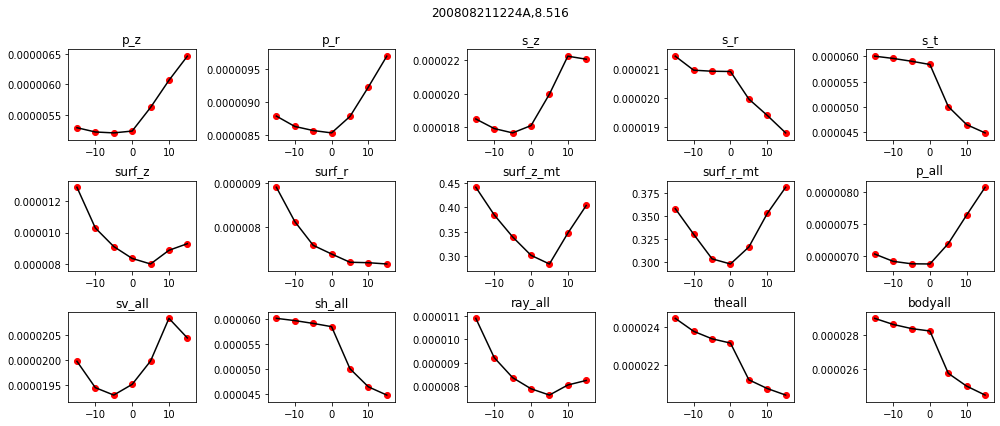

['d-15(5.0)', 'd-10(6.172)', 'd-5(7.343999999999999)', 'd0(8.516)', 'd5(13.516)', 'd10(18.516)', 'd15(23.516)']


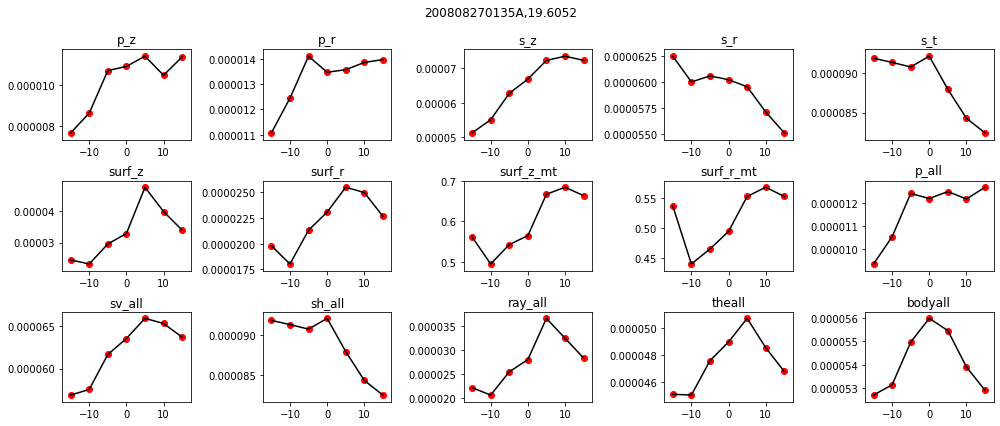

['d-15(5.0)', 'd-10(9.868400000000001)', 'd-5(14.7368)', 'd0(19.6052)', 'd5(24.6052)', 'd10(29.6052)', 'd15(34.605199999999996)']


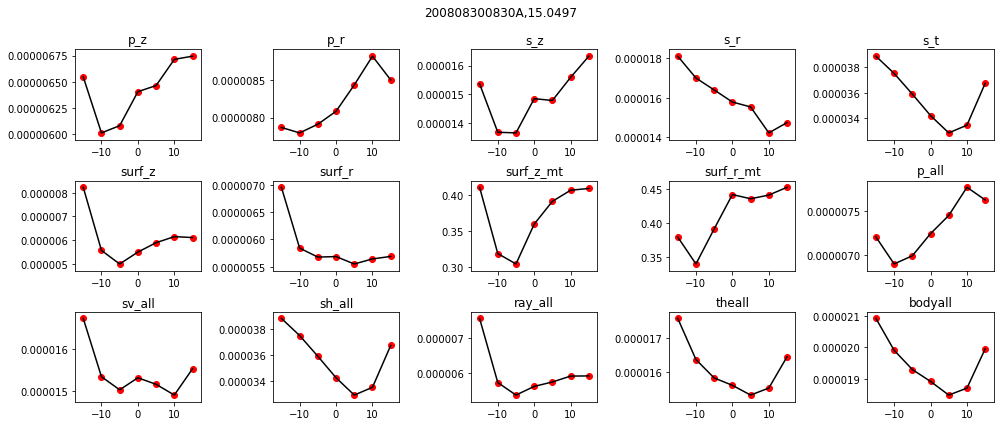

['d-15(5.0)', 'd-10(8.3499)', 'd-5(11.6998)', 'd0(15.0497)', 'd5(20.0497)', 'd10(25.0497)', 'd15(30.0497)']


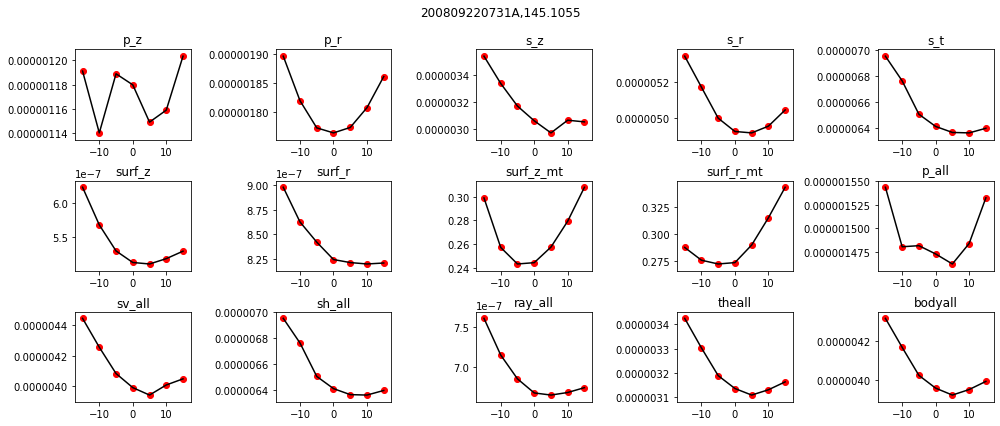

['d-15(130.1055)', 'd-10(135.1055)', 'd-5(140.1055)', 'd0(145.1055)', 'd5(150.1055)', 'd10(155.1055)', 'd15(160.1055)']


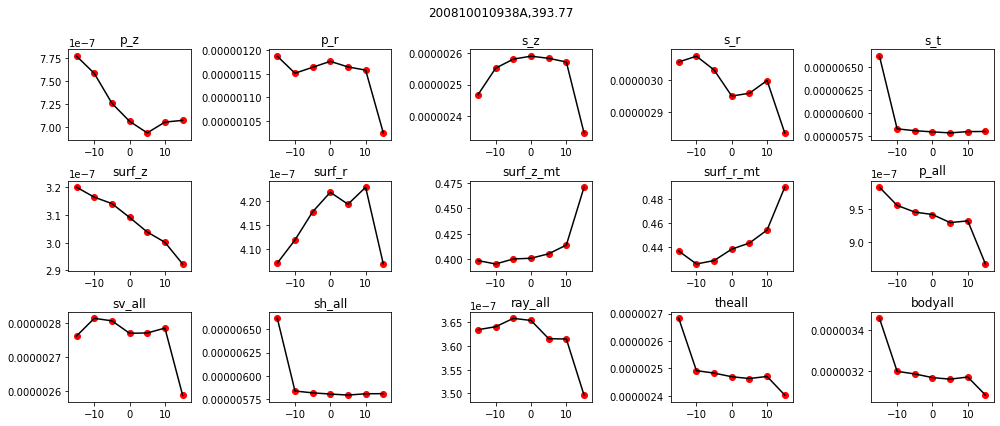

['d-15(378.77)', 'd-10(383.77)', 'd-5(388.77)', 'd0(393.77)', 'd5(398.77)', 'd10(403.77)', 'd15(408.77)']


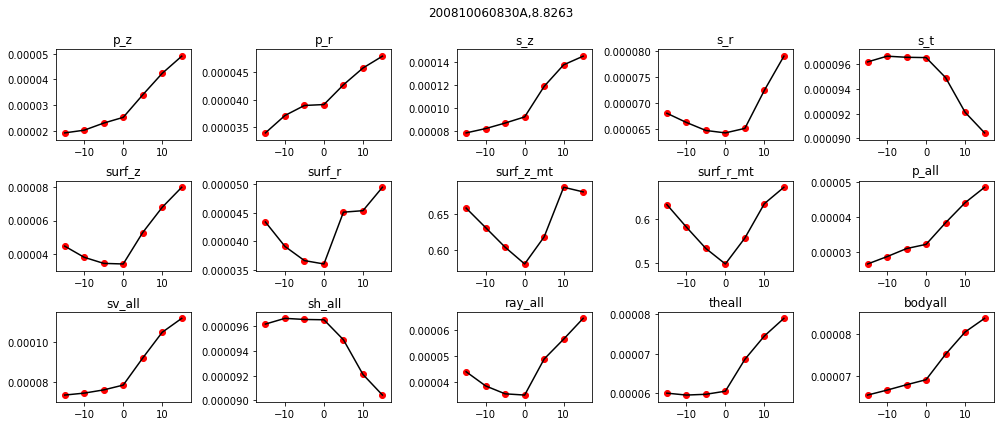

['d-15(5.0)', 'd-10(6.275433333333333)', 'd-5(7.550866666666666)', 'd0(8.8263)', 'd5(13.8263)', 'd10(18.8263)', 'd15(23.8263)']


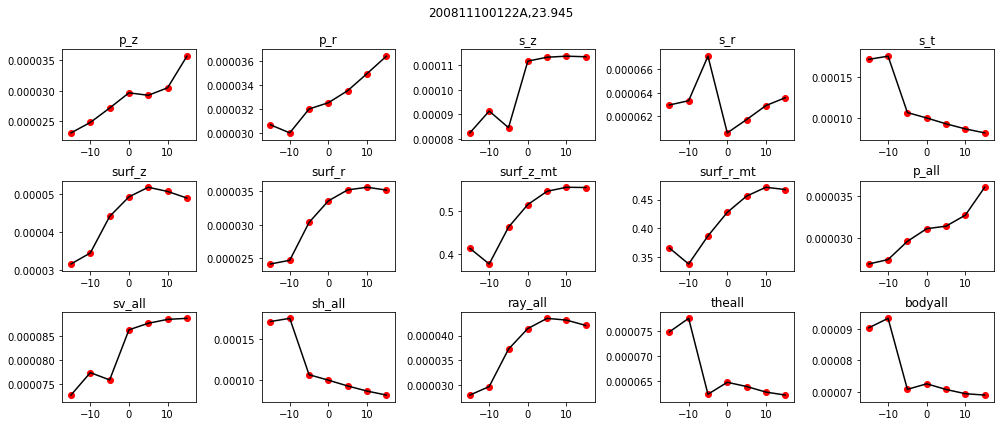

['d-15(8.945)', 'd-10(13.945)', 'd-5(18.945)', 'd0(23.945)', 'd5(28.945)', 'd10(33.945)', 'd15(38.945)']


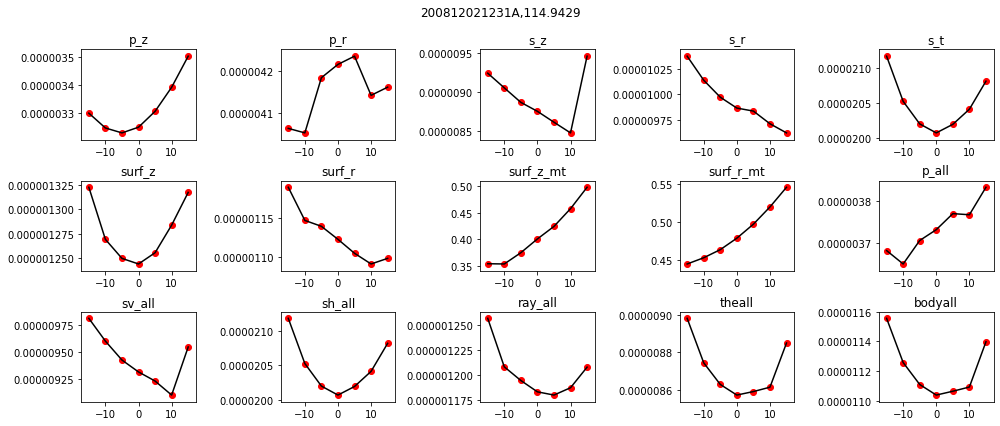

['d-15(99.9429)', 'd-10(104.9429)', 'd-5(109.9429)', 'd0(114.9429)', 'd5(119.9429)', 'd10(124.9429)', 'd15(129.9429)']


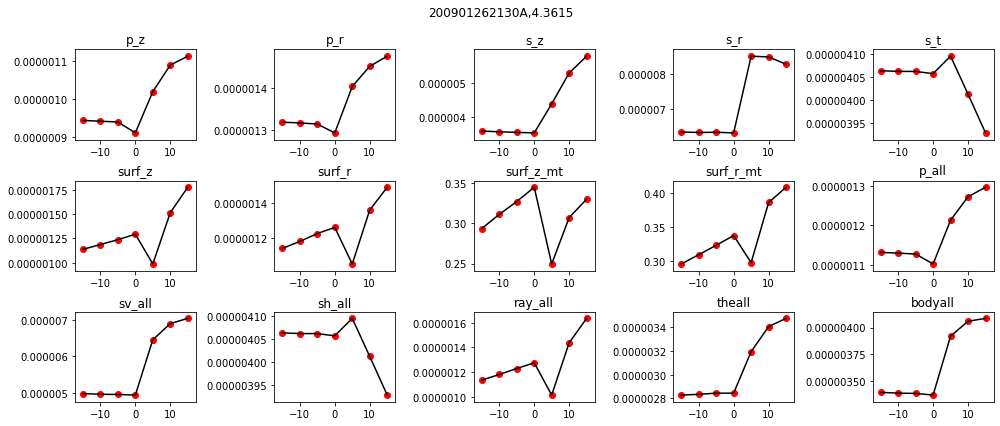

['d-15(5.0)', 'd-10(4.787166666666667)', 'd-5(4.574333333333334)', 'd0(4.3615)', 'd5(9.3615)', 'd10(14.3615)', 'd15(19.3615)']


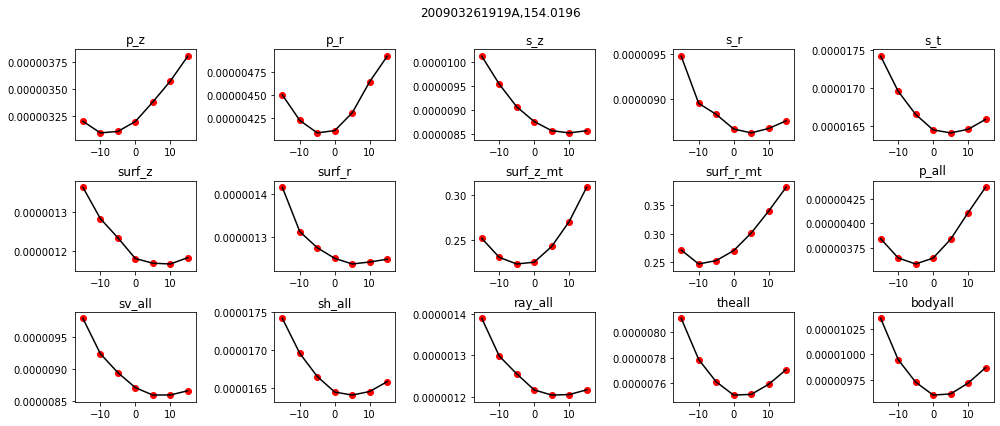

['d-15(139.0196)', 'd-10(144.0196)', 'd-5(149.0196)', 'd0(154.0196)', 'd5(159.0196)', 'd10(164.0196)', 'd15(169.0196)']


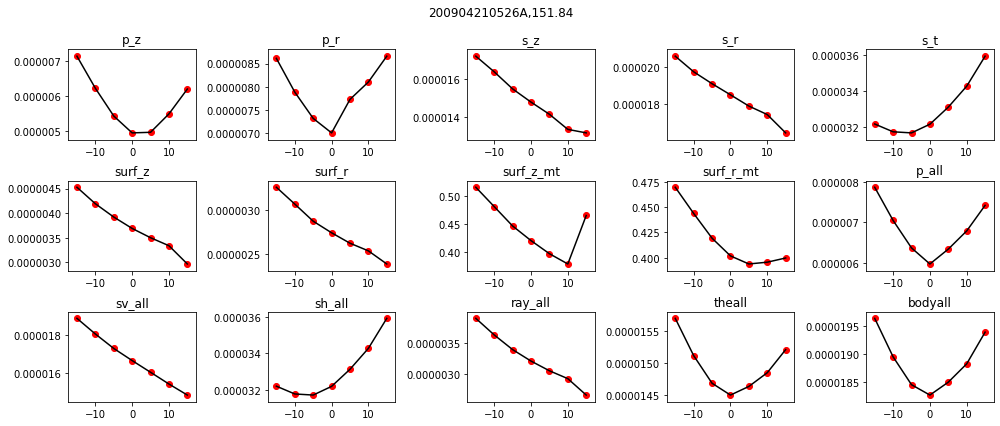

['d-15(136.84)', 'd-10(141.84)', 'd-5(146.84)', 'd0(151.84)', 'd5(156.84)', 'd10(161.84)', 'd15(166.84)']


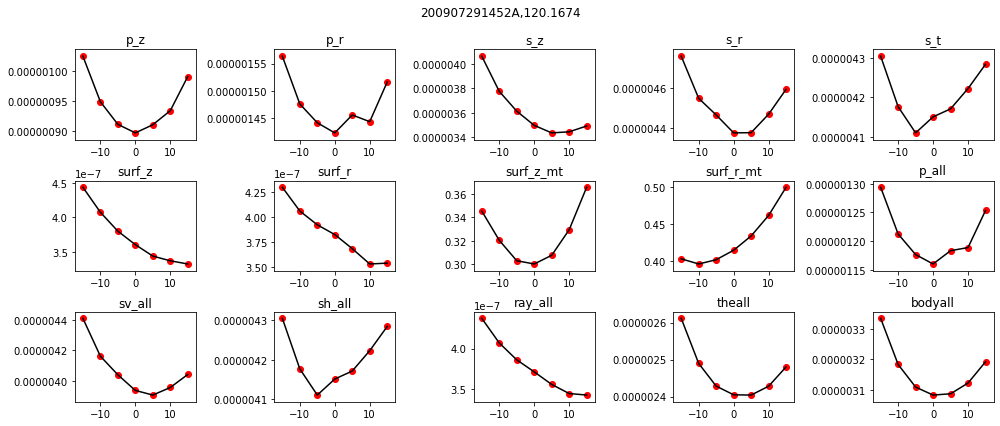

['d-15(105.1674)', 'd-10(110.1674)', 'd-5(115.1674)', 'd0(120.1674)', 'd5(125.1674)', 'd10(130.1674)', 'd15(135.1674)']


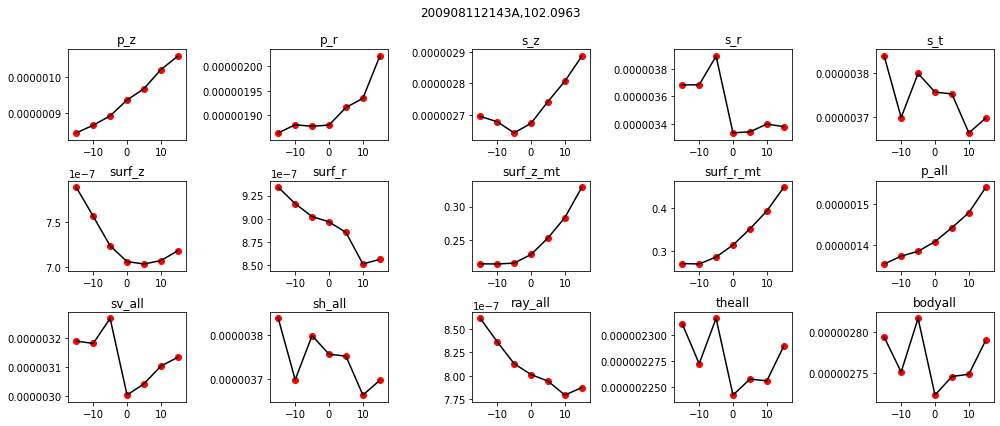

['d-15(87.0963)', 'd-10(92.0963)', 'd-5(97.0963)', 'd0(102.0963)', 'd5(107.0963)', 'd10(112.0963)', 'd15(117.0963)']


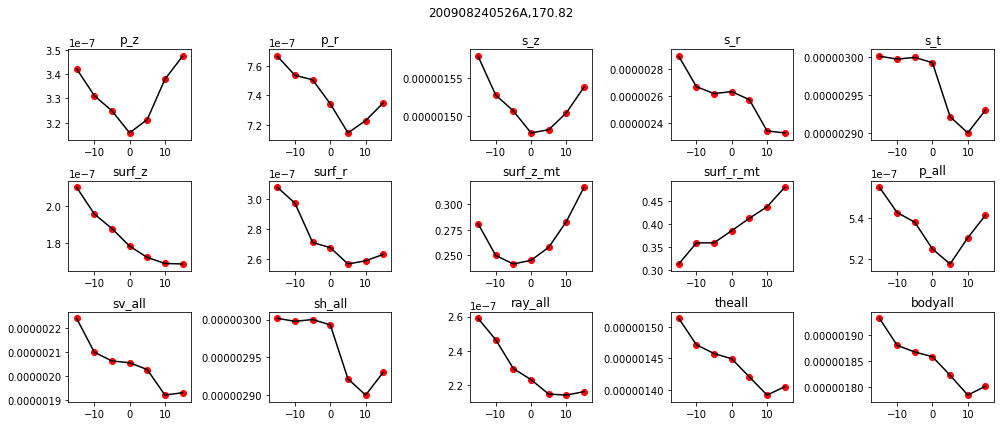

['d-15(155.82)', 'd-10(160.82)', 'd-5(165.82)', 'd0(170.82)', 'd5(175.82)', 'd10(180.82)', 'd15(185.82)']


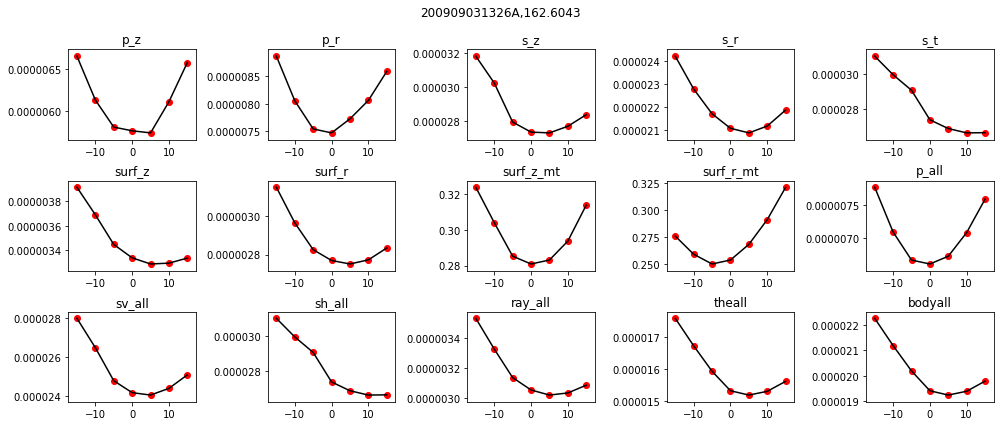

['d-15(147.6043)', 'd-10(152.6043)', 'd-5(157.6043)', 'd0(162.6043)', 'd5(167.6043)', 'd10(172.6043)', 'd15(177.6043)']


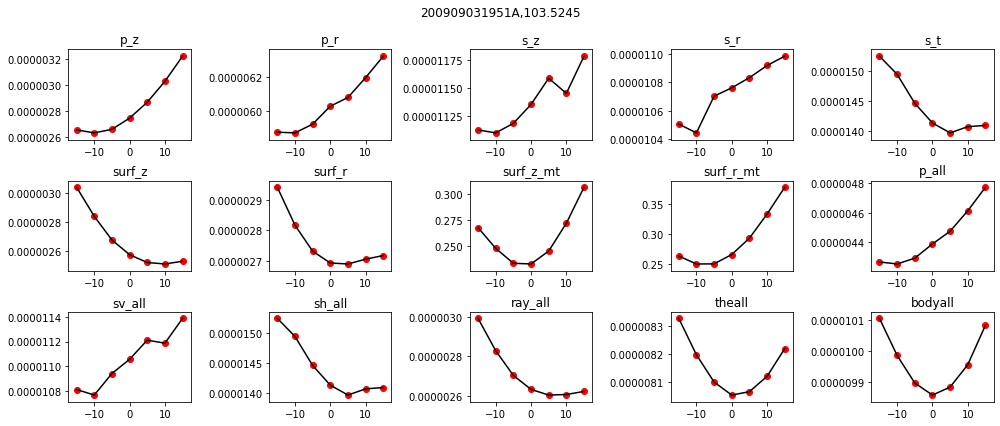

['d-15(88.5245)', 'd-10(93.5245)', 'd-5(98.5245)', 'd0(103.5245)', 'd5(108.5245)', 'd10(113.5245)', 'd15(118.5245)']


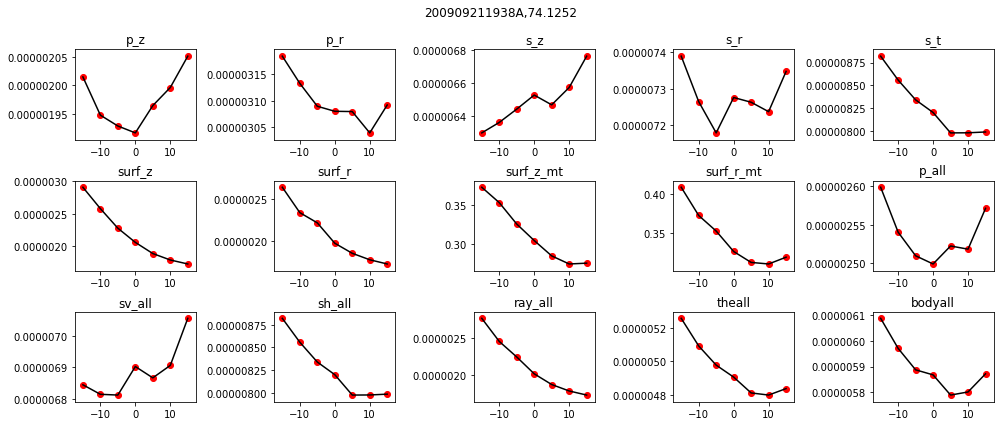

['d-15(59.12520000000001)', 'd-10(64.1252)', 'd-5(69.1252)', 'd0(74.1252)', 'd5(79.1252)', 'd10(84.1252)', 'd15(89.1252)']


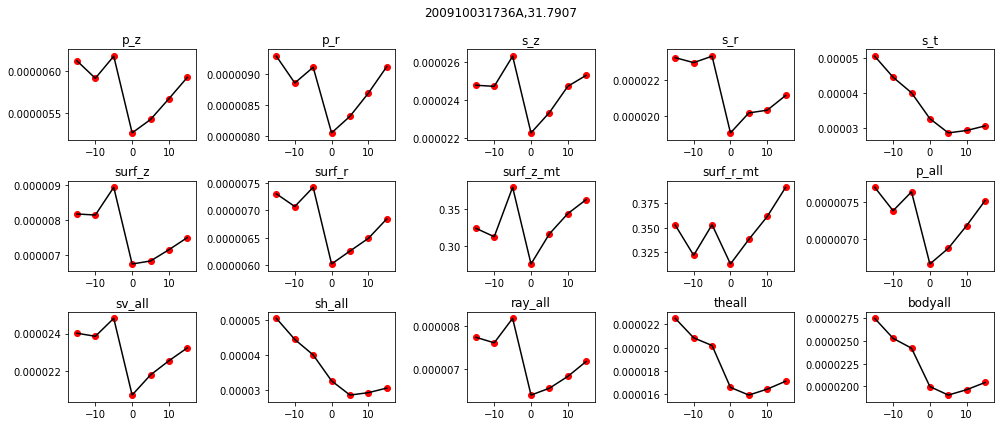

['d-15(16.7907)', 'd-10(21.7907)', 'd-5(26.7907)', 'd0(31.7907)', 'd5(36.7907)', 'd10(41.7907)', 'd15(46.7907)']


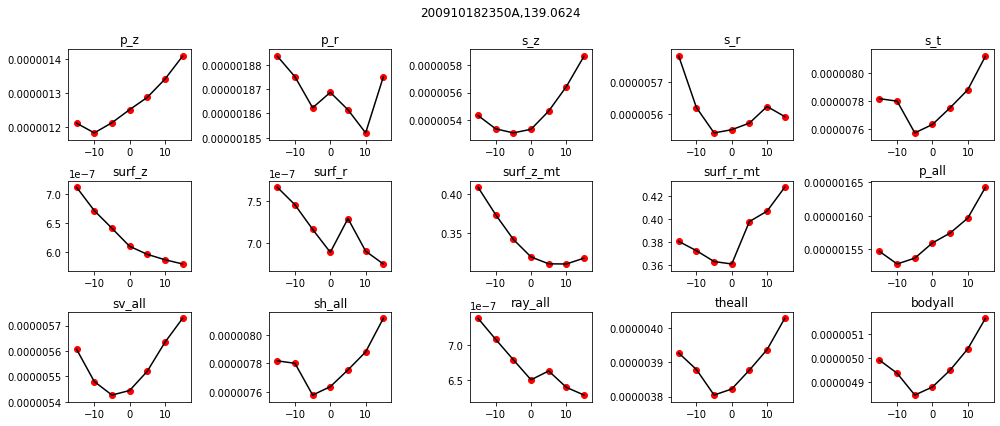

['d-15(124.0624)', 'd-10(129.0624)', 'd-5(134.0624)', 'd0(139.0624)', 'd5(144.0624)', 'd10(149.0624)', 'd15(154.0624)']


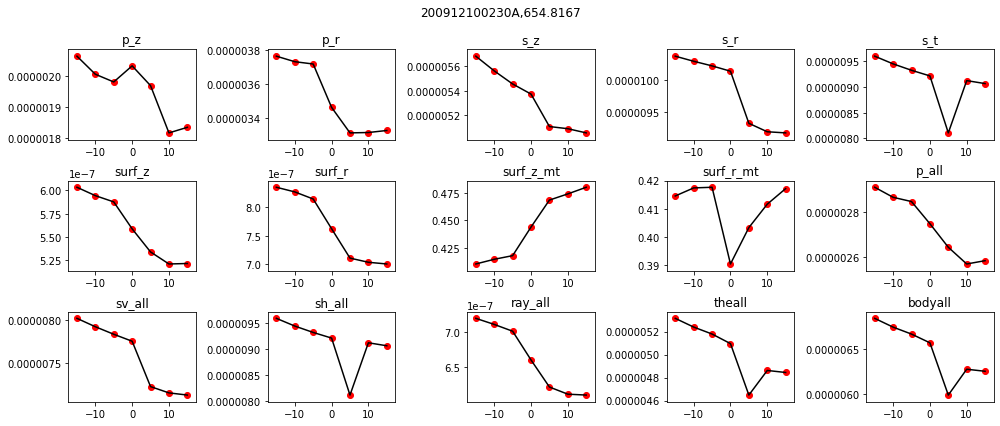

['d-15(639.8167)', 'd-10(644.8167)', 'd-5(649.8167)', 'd0(654.8167)', 'd5(659.8167)', 'd10(664.8167)', 'd15(669.8167)']


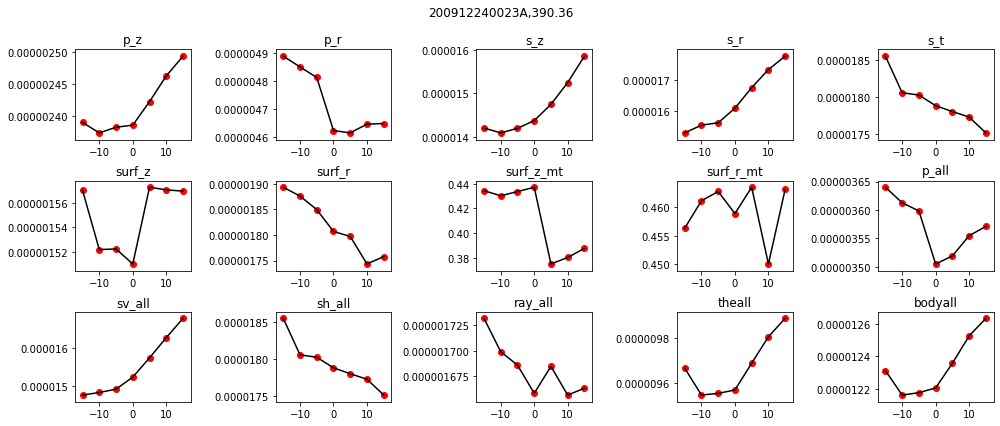

['d-15(375.36)', 'd-10(380.36)', 'd-5(385.36)', 'd0(390.36)', 'd5(395.36)', 'd10(400.36)', 'd15(405.36)']


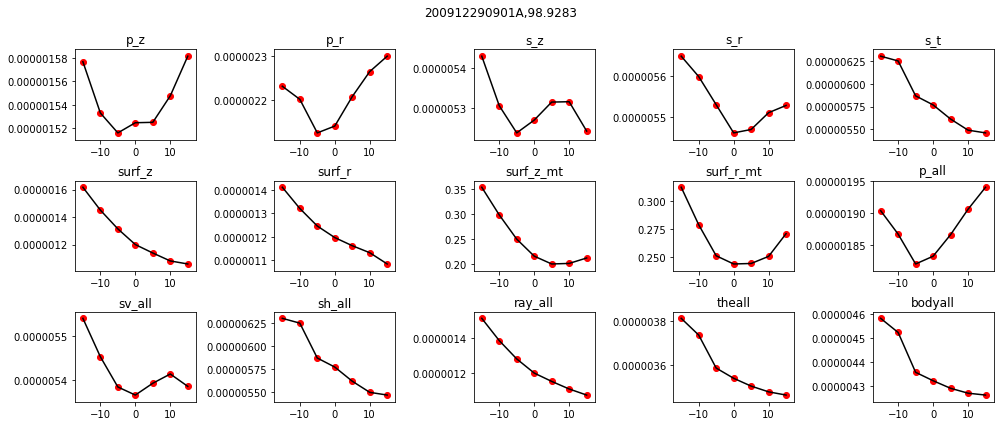

['d-15(83.9283)', 'd-10(88.9283)', 'd-5(93.9283)', 'd0(98.9283)', 'd5(103.9283)', 'd10(108.9283)', 'd15(113.9283)']


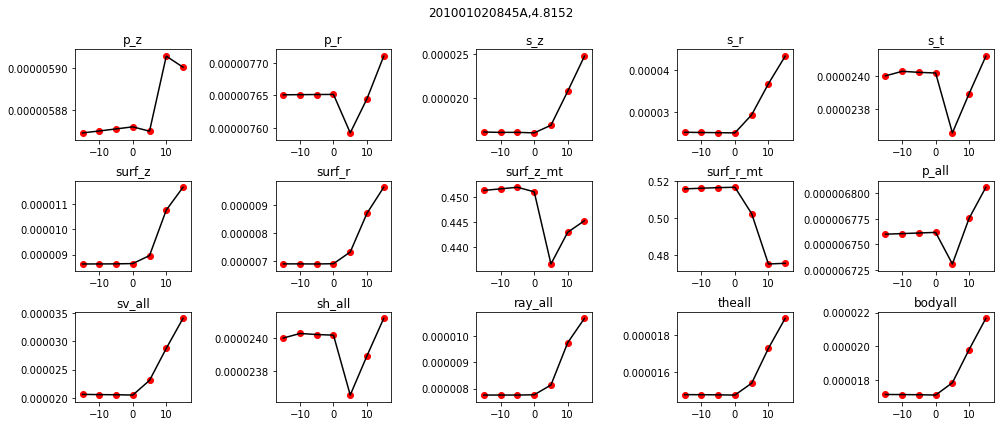

['d-15(5.0)', 'd-10(4.9384)', 'd-5(4.8768)', 'd0(4.8152)', 'd5(9.8152)', 'd10(14.8152)', 'd15(19.8152)']


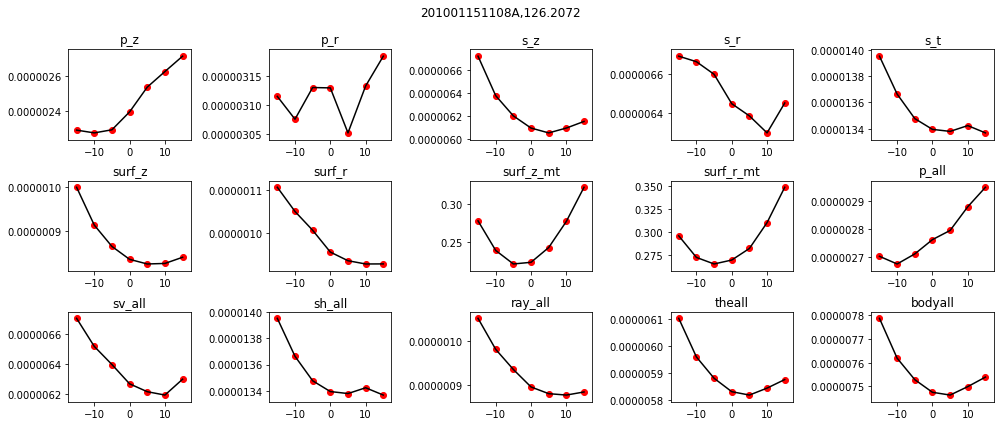

['d-15(111.2072)', 'd-10(116.2072)', 'd-5(121.2072)', 'd0(126.2072)', 'd5(131.2072)', 'd10(136.2072)', 'd15(141.2072)']


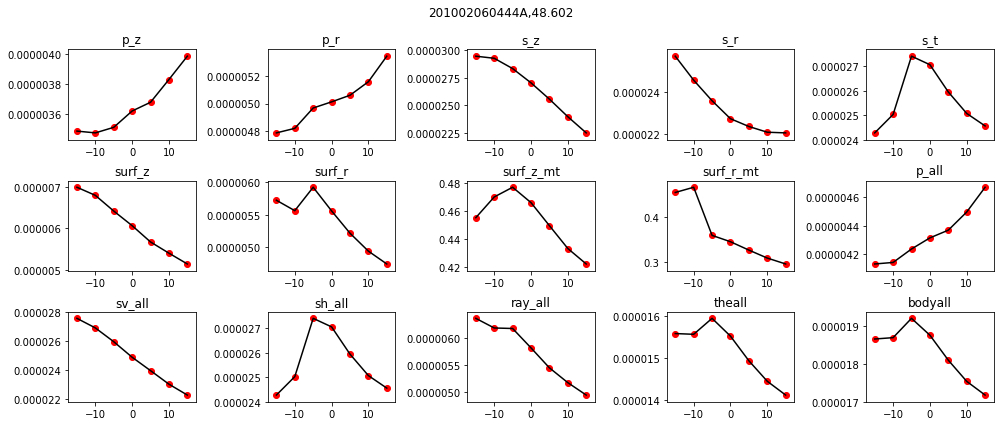

['d-15(33.602)', 'd-10(38.602)', 'd-5(43.602)', 'd0(48.602)', 'd5(53.602)', 'd10(58.602)', 'd15(63.602)']


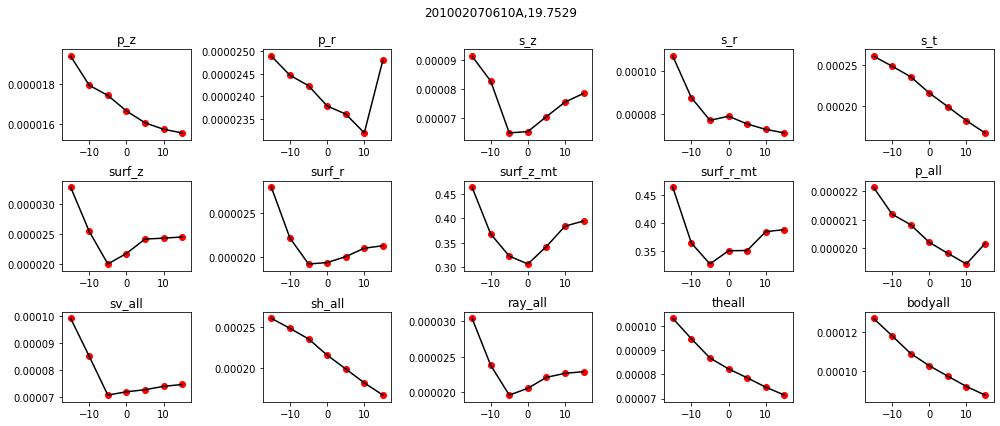

['d-15(5.0)', 'd-10(9.917633333333335)', 'd-5(14.835266666666667)', 'd0(19.7529)', 'd5(24.7529)', 'd10(29.7529)', 'd15(34.7529)']


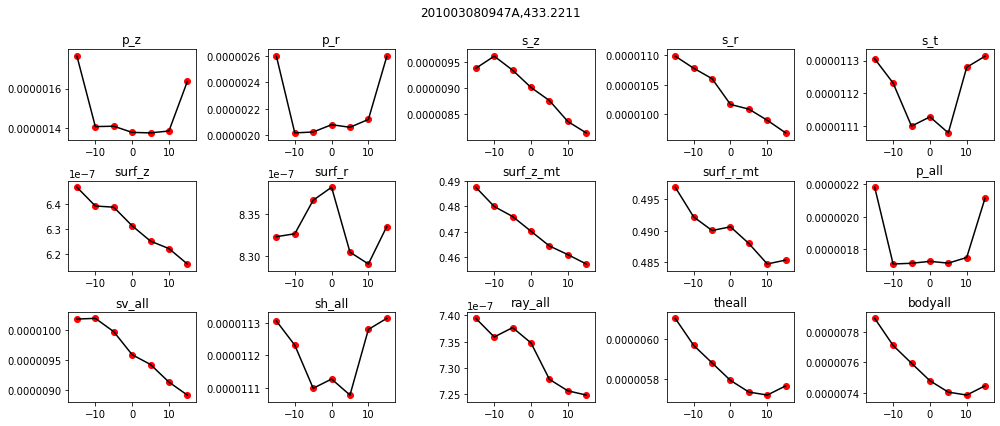

['d-15(418.2211)', 'd-10(423.2211)', 'd-5(428.2211)', 'd0(433.2211)', 'd5(438.2211)', 'd10(443.2211)', 'd15(448.2211)']


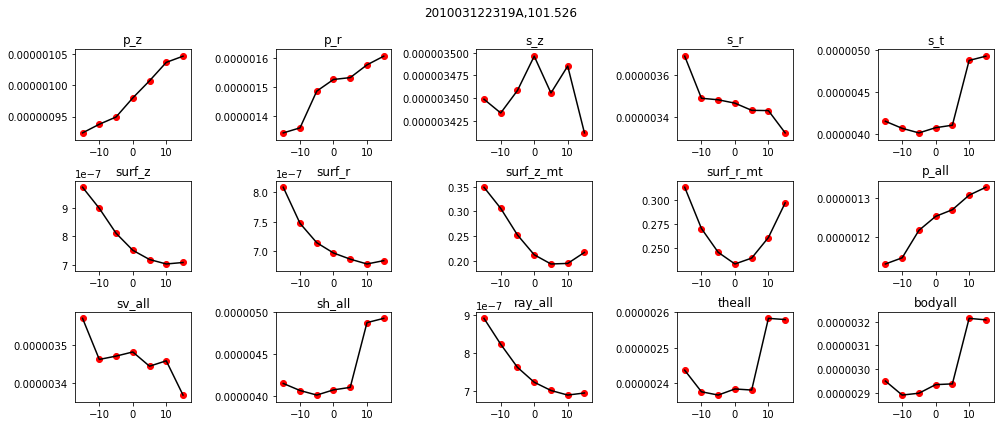

['d-15(86.526)', 'd-10(91.526)', 'd-5(96.526)', 'd0(101.526)', 'd5(106.526)', 'd10(111.526)', 'd15(116.526)']


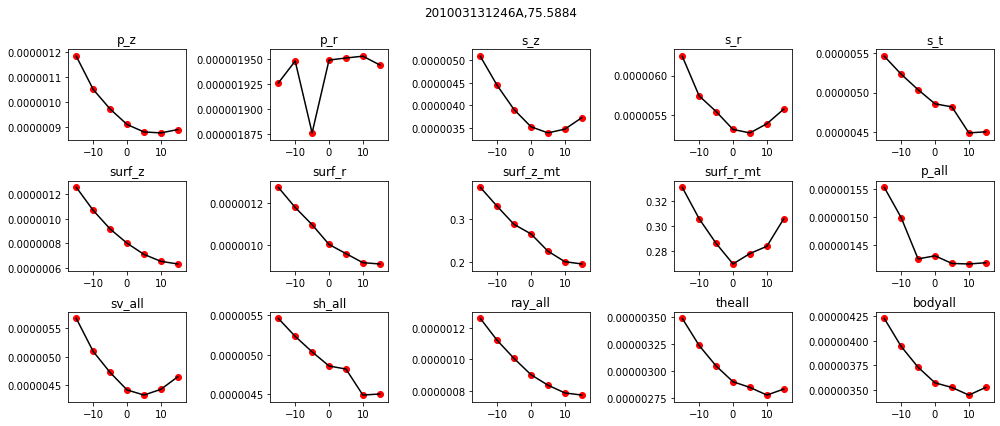

['d-15(60.58839999999999)', 'd-10(65.5884)', 'd-5(70.5884)', 'd0(75.5884)', 'd5(80.5884)', 'd10(85.5884)', 'd15(90.5884)']


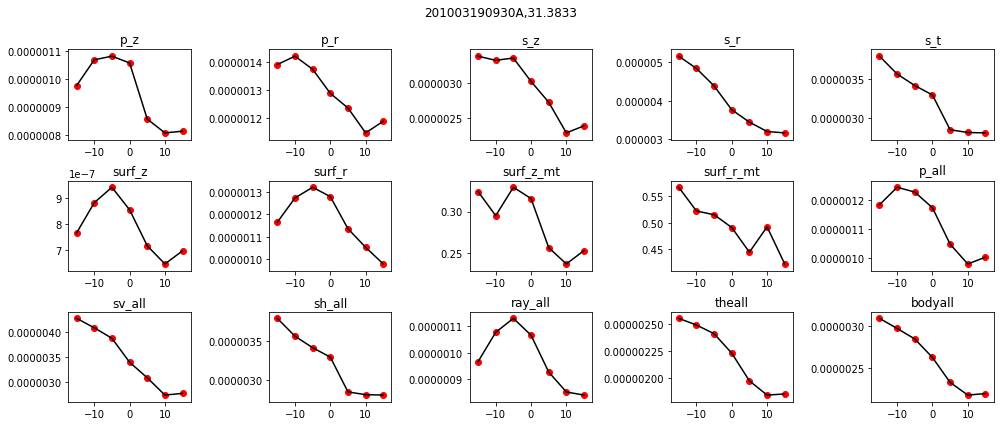

['d-15(16.3833)', 'd-10(21.3833)', 'd-5(26.3833)', 'd0(31.3833)', 'd5(36.3833)', 'd10(41.3833)', 'd15(46.3833)']


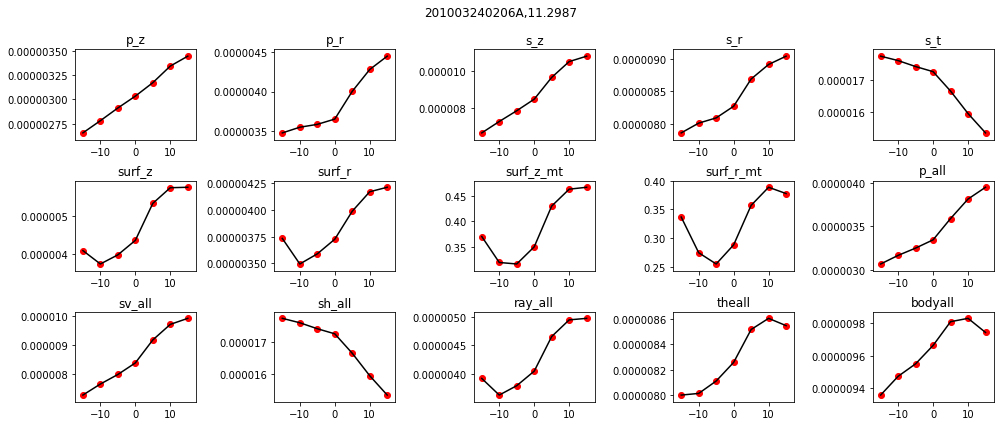

['d-15(5.0)', 'd-10(7.099566666666666)', 'd-5(9.199133333333332)', 'd0(11.2987)', 'd5(16.2987)', 'd10(21.2987)', 'd15(26.2987)']


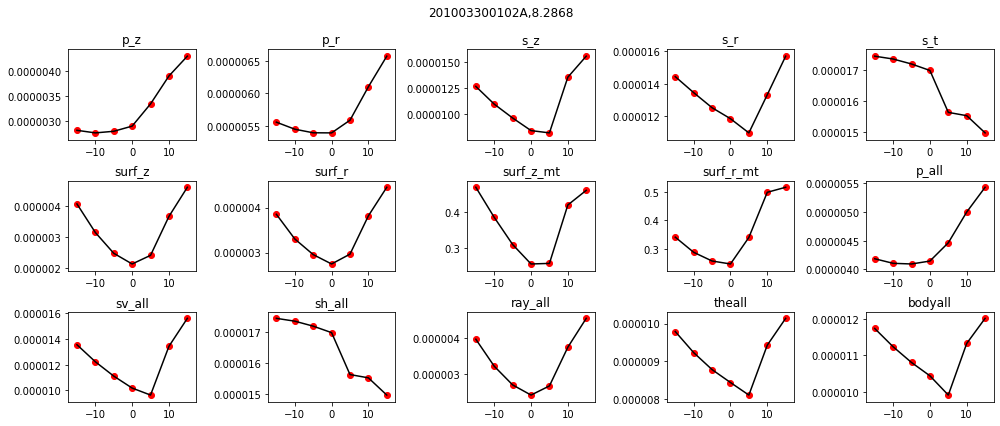

['d-15(5.0)', 'd-10(6.0956)', 'd-5(7.1912)', 'd0(8.2868)', 'd5(13.2868)', 'd10(18.2868)', 'd15(23.2868)']


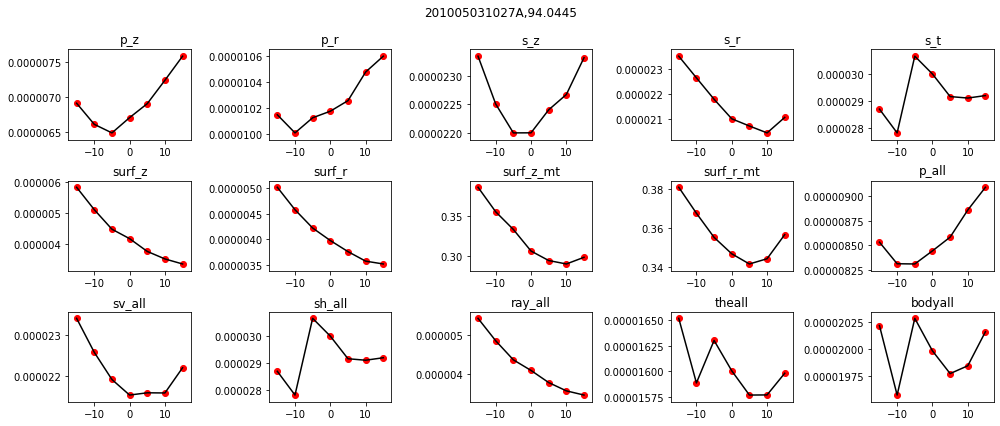

['d-15(79.0445)', 'd-10(84.0445)', 'd-5(89.0445)', 'd0(94.0445)', 'd5(99.0445)', 'd10(104.0445)', 'd15(109.0445)']


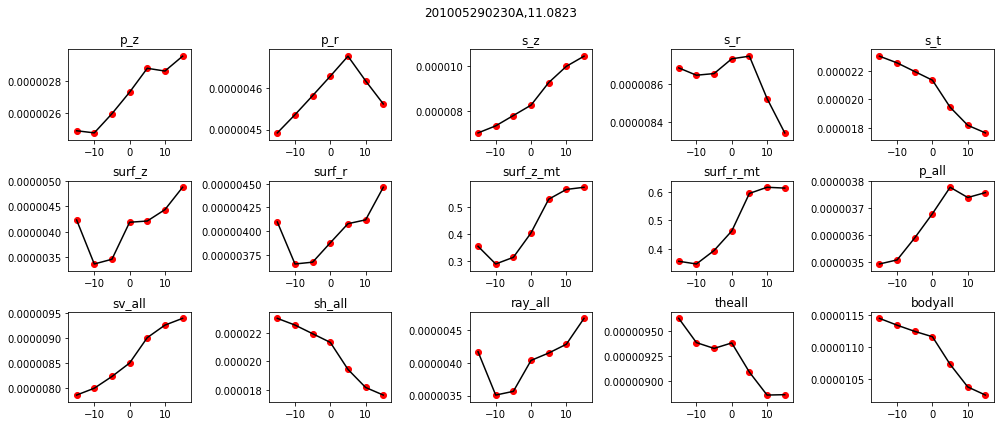

['d-15(5.0)', 'd-10(7.027433333333333)', 'd-5(9.054866666666666)', 'd0(11.0823)', 'd5(16.0823)', 'd10(21.0823)', 'd15(26.0823)']


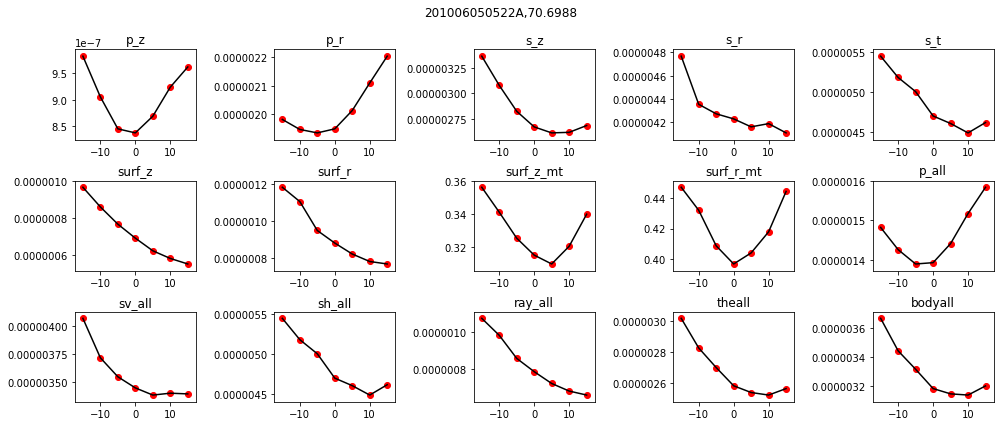

['d-15(55.698800000000006)', 'd-10(60.698800000000006)', 'd-5(65.6988)', 'd0(70.6988)', 'd5(75.6988)', 'd10(80.6988)', 'd15(85.6988)']


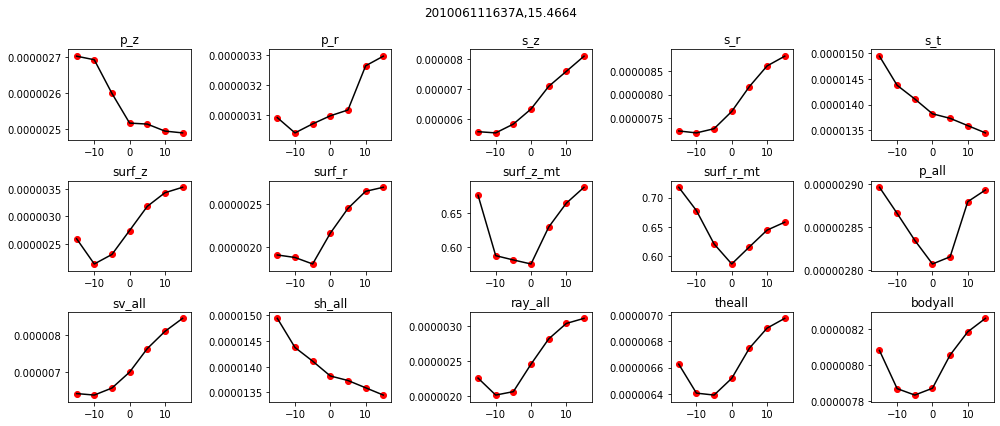

['d-15(5.0)', 'd-10(8.4888)', 'd-5(11.977599999999999)', 'd0(15.4664)', 'd5(20.4664)', 'd10(25.4664)', 'd15(30.4664)']


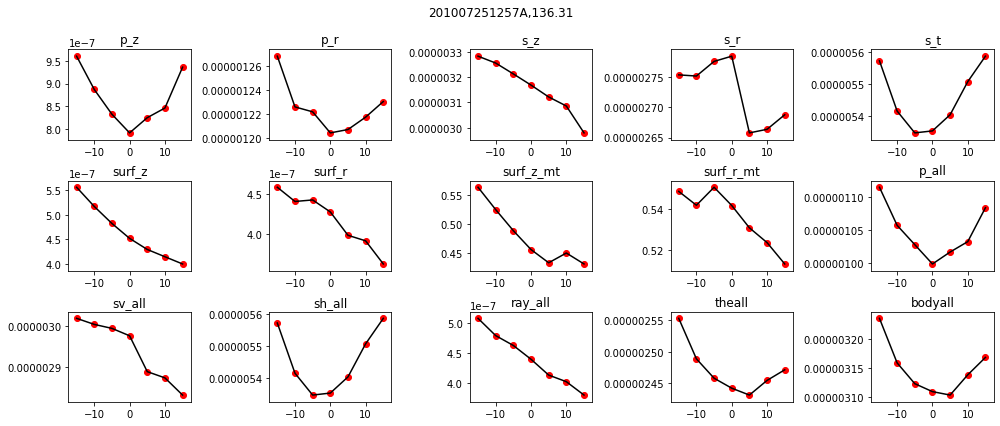

['d-15(121.31)', 'd-10(126.31)', 'd-5(131.31)', 'd0(136.31)', 'd5(141.31)', 'd10(146.31)', 'd15(151.31)']


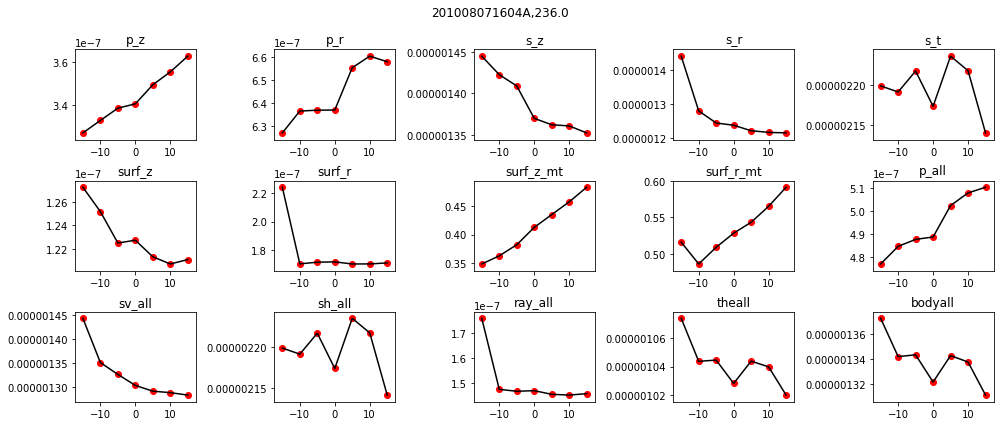

['d-15(221.0)', 'd-10(226.0)', 'd-5(231.0)', 'd0(236.0)', 'd5(241.0)', 'd10(246.0)', 'd15(251.0)']


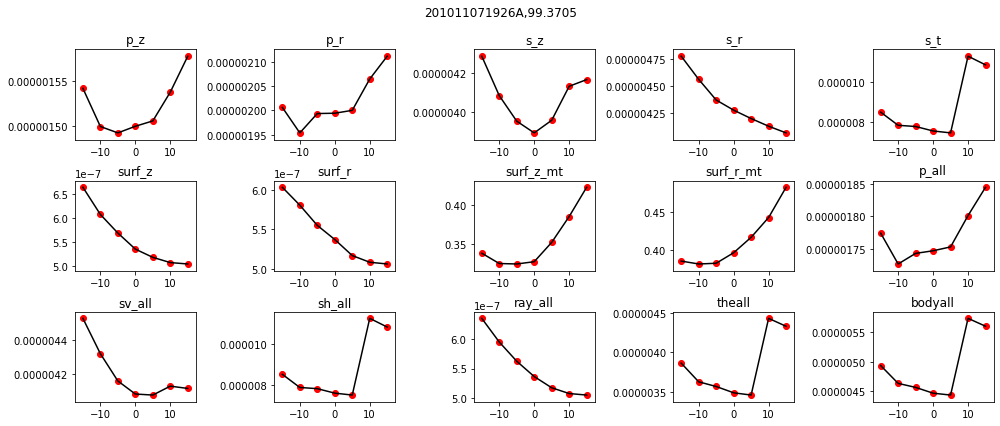

['d-15(84.3705)', 'd-10(89.3705)', 'd-5(94.3705)', 'd0(99.3705)', 'd5(104.3705)', 'd10(109.3705)', 'd15(114.3705)']


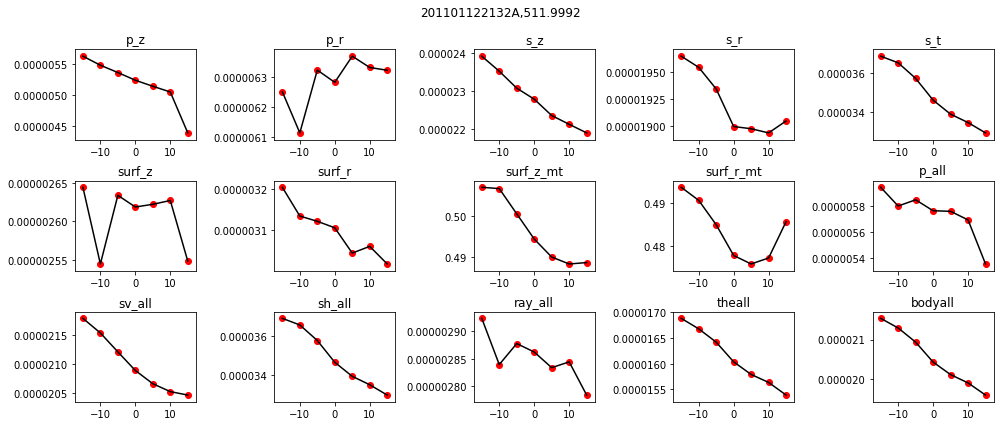

['d-15(496.9992)', 'd-10(501.9992)', 'd-5(506.9992)', 'd0(511.9992)', 'd5(516.9992)', 'd10(521.9992)', 'd15(526.9992)']


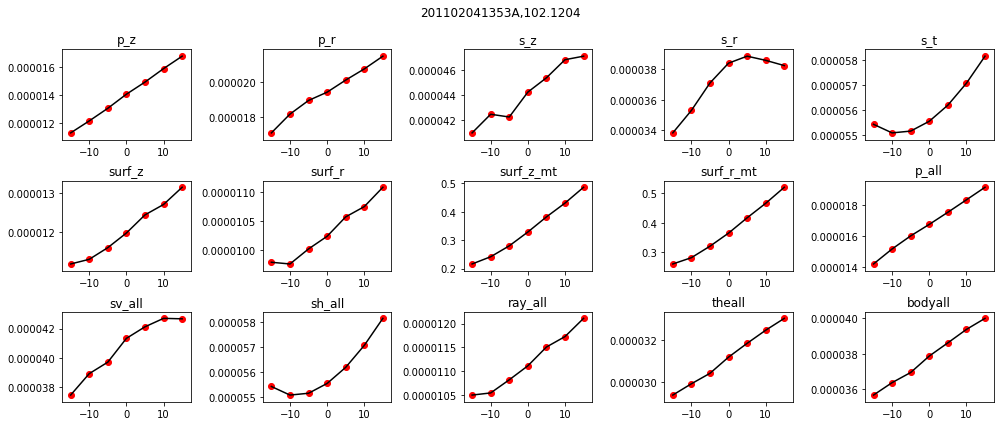

['d-15(87.1204)', 'd-10(92.1204)', 'd-5(97.1204)', 'd0(102.1204)', 'd5(107.1204)', 'd10(112.1204)', 'd15(117.1204)']


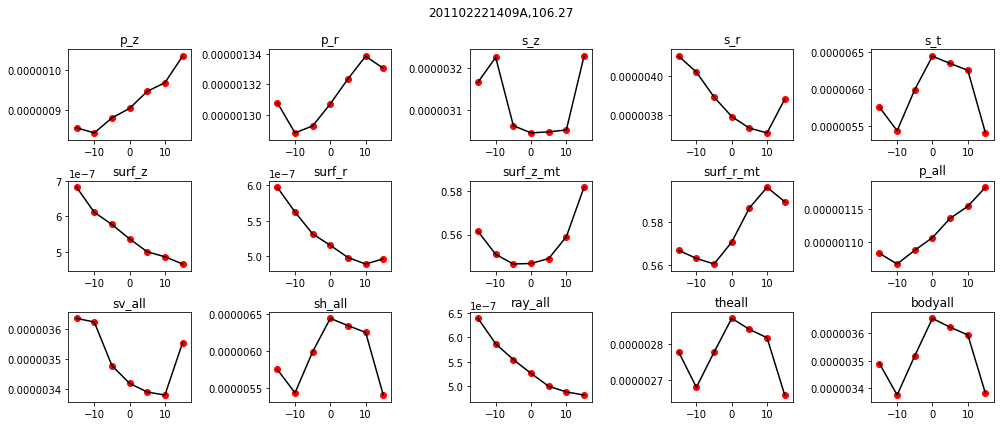

['d-15(91.27)', 'd-10(96.27)', 'd-5(101.27)', 'd0(106.27)', 'd5(111.27)', 'd10(116.27)', 'd15(121.27)']


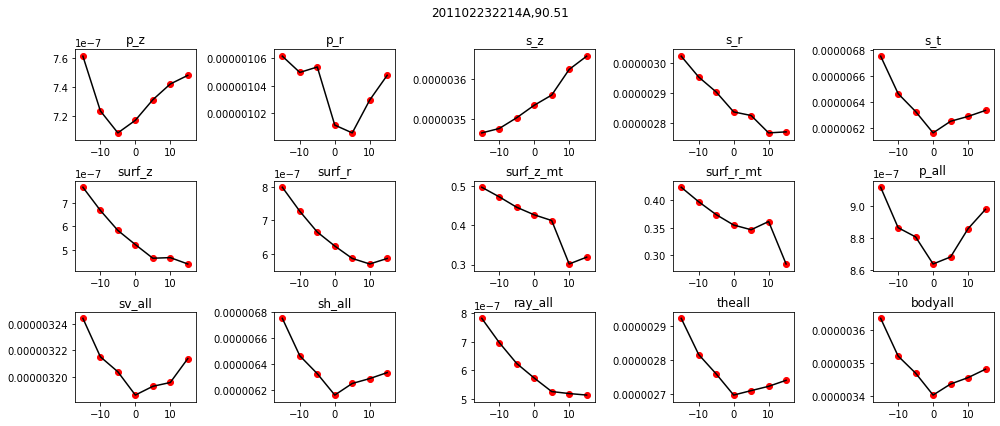

['d-15(75.51)', 'd-10(80.51)', 'd-5(85.51)', 'd0(90.51)', 'd5(95.51)', 'd10(100.51)', 'd15(105.51)']


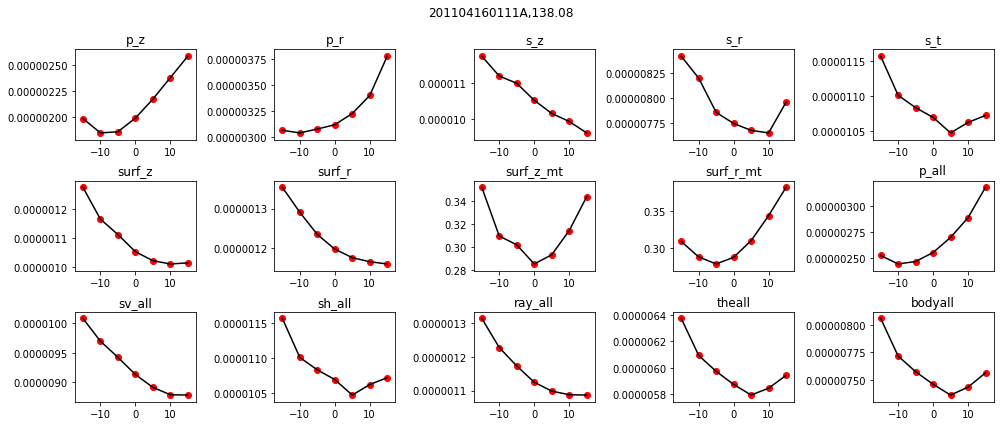

['d-15(123.08000000000001)', 'd-10(128.08)', 'd-5(133.08)', 'd0(138.08)', 'd5(143.08)', 'd10(148.08)', 'd15(153.08)']


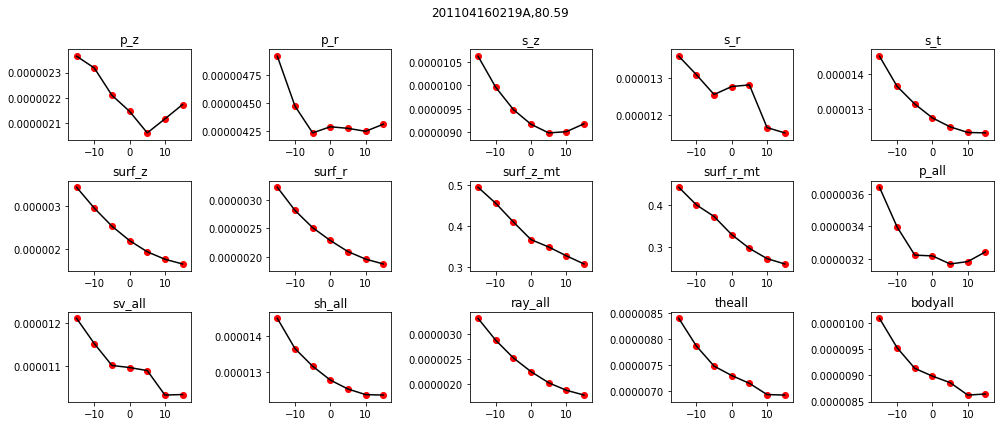

['d-15(65.59)', 'd-10(70.59)', 'd-5(75.59)', 'd0(80.59)', 'd5(85.59)', 'd10(90.59)', 'd15(95.59)']


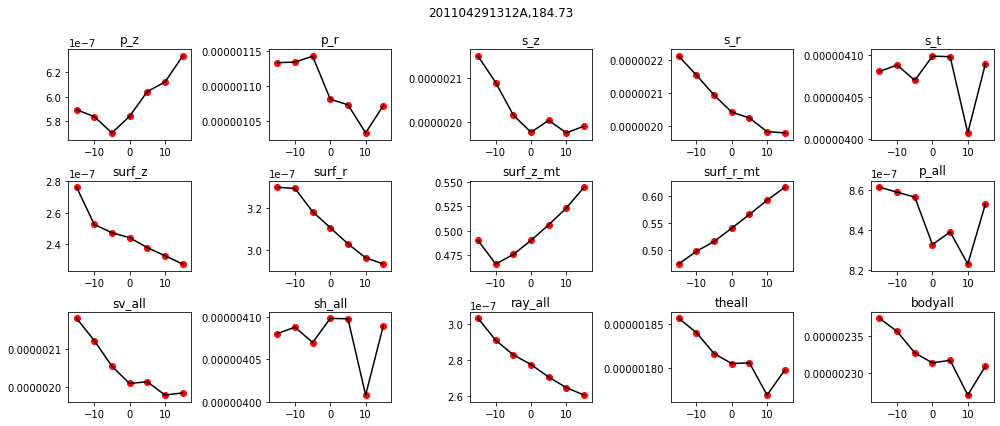

['d-15(169.73)', 'd-10(174.73)', 'd-5(179.73)', 'd0(184.73)', 'd5(189.73)', 'd10(194.73)', 'd15(199.73)']


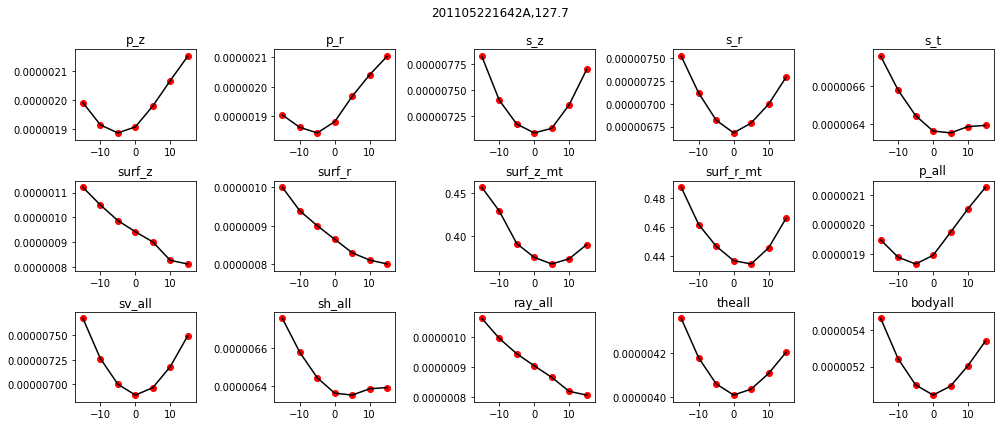

['d-15(112.7)', 'd-10(117.7)', 'd-5(122.7)', 'd0(127.7)', 'd5(132.7)', 'd10(137.7)', 'd15(142.7)']


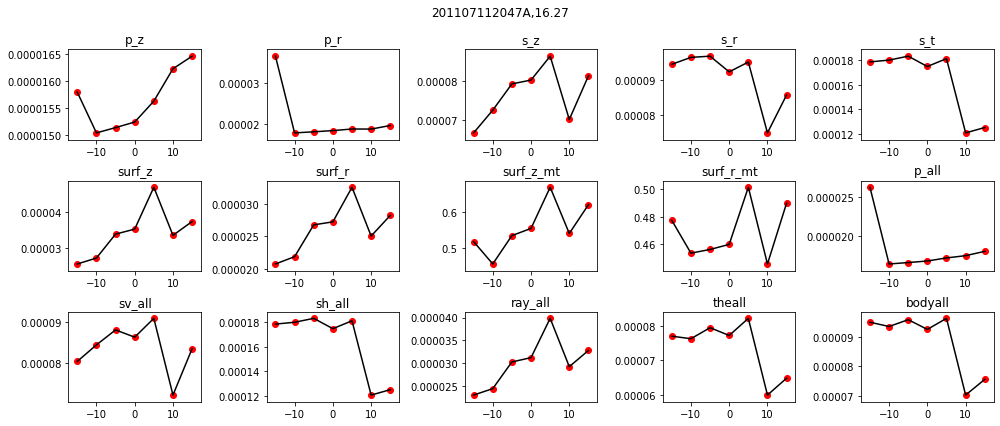

['d-15(5.0)', 'd-10(8.756666666666666)', 'd-5(12.513333333333332)', 'd0(16.27)', 'd5(21.27)', 'd10(26.27)', 'd15(31.27)']


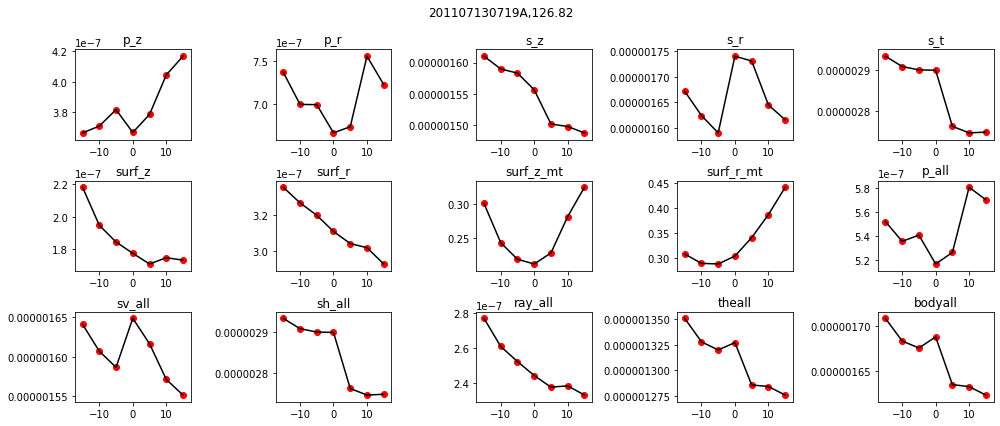

['d-15(111.82)', 'd-10(116.82)', 'd-5(121.82)', 'd0(126.82)', 'd5(131.82)', 'd10(136.82)', 'd15(141.82)']


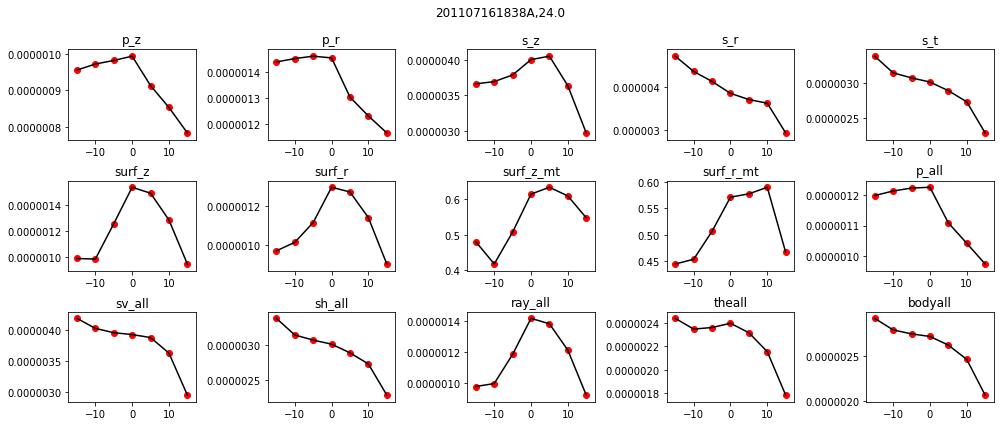

['d-15(9.0)', 'd-10(14.0)', 'd-5(19.0)', 'd0(24.0)', 'd5(29.0)', 'd10(34.0)', 'd15(39.0)']


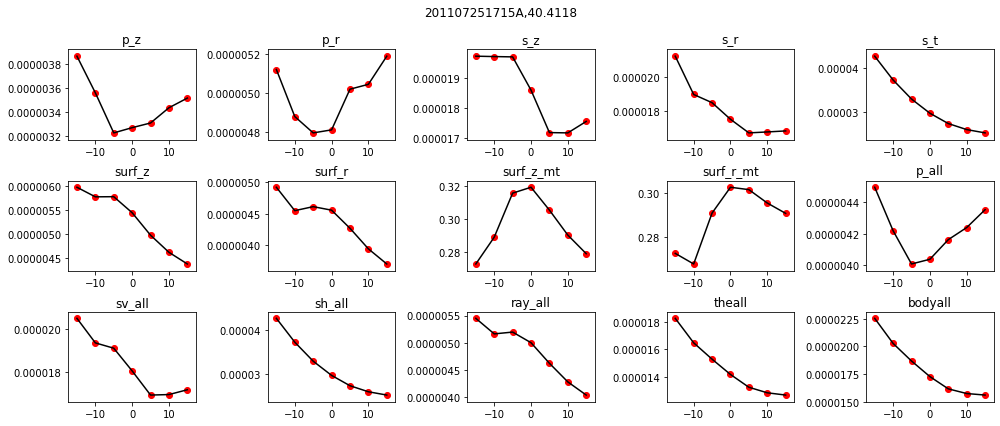

['d-15(25.4118)', 'd-10(30.4118)', 'd-5(35.4118)', 'd0(40.4118)', 'd5(45.4118)', 'd10(50.4118)', 'd15(55.4118)']


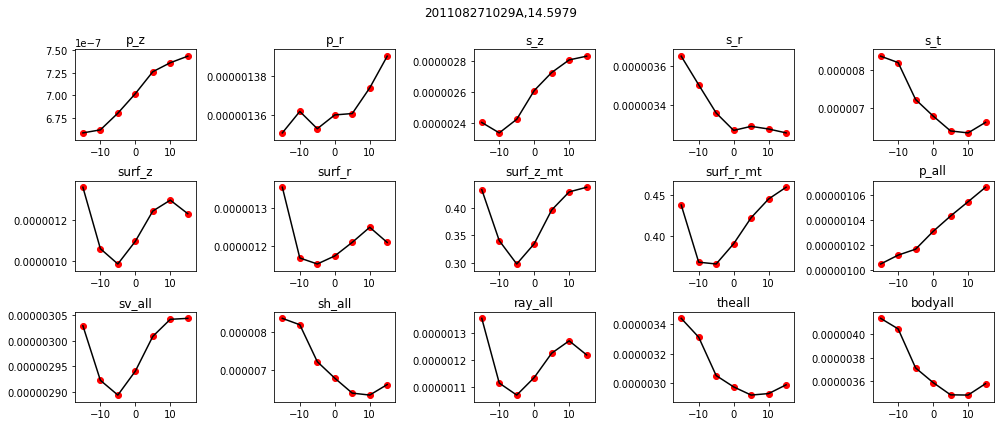

['d-15(5.0)', 'd-10(8.1993)', 'd-5(11.398599999999998)', 'd0(14.5979)', 'd5(19.5979)', 'd10(24.5979)', 'd15(29.5979)']


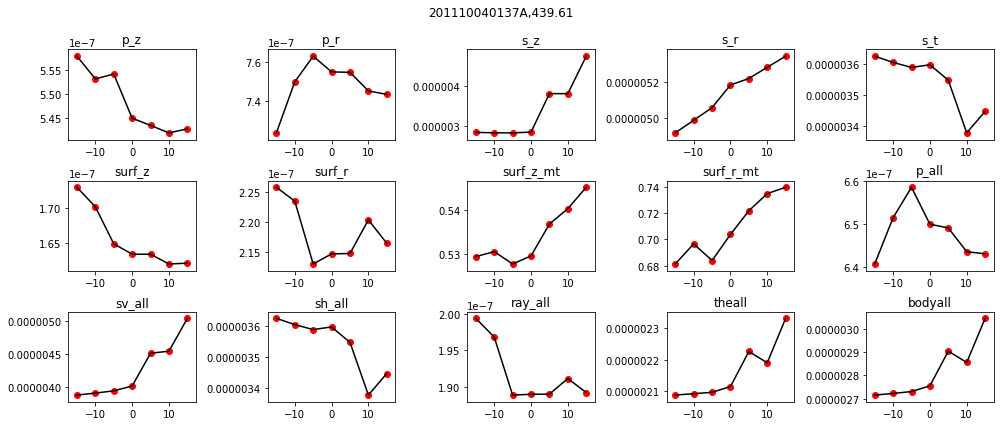

['d-15(424.61)', 'd-10(429.61)', 'd-5(434.61)', 'd0(439.61)', 'd5(444.61)', 'd10(449.61)', 'd15(454.61)']


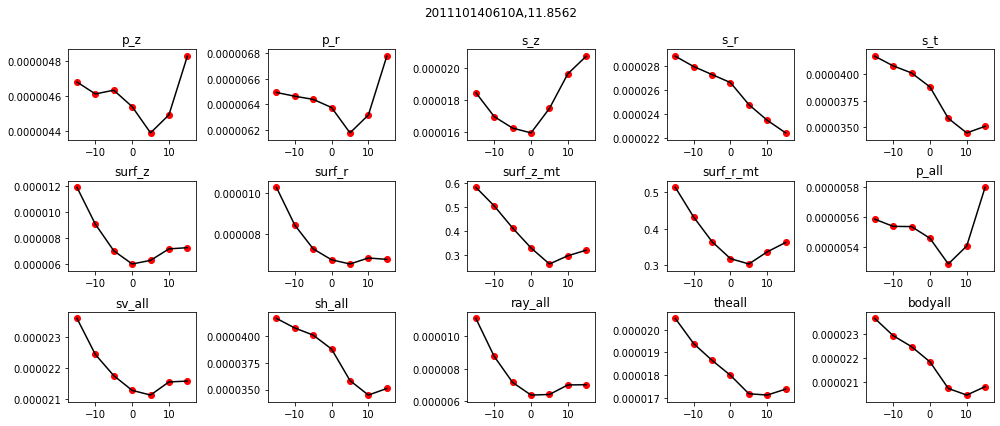

['d-15(5.0)', 'd-10(7.285399999999999)', 'd-5(9.570799999999998)', 'd0(11.8562)', 'd5(16.8562)', 'd10(21.8562)', 'd15(26.8562)']


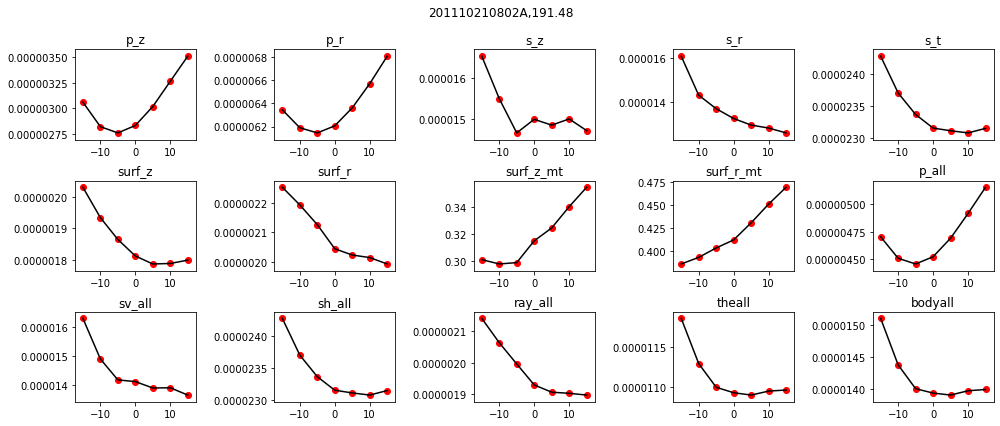

['d-15(176.48)', 'd-10(181.48)', 'd-5(186.48)', 'd0(191.48)', 'd5(196.48)', 'd10(201.48)', 'd15(206.48)']


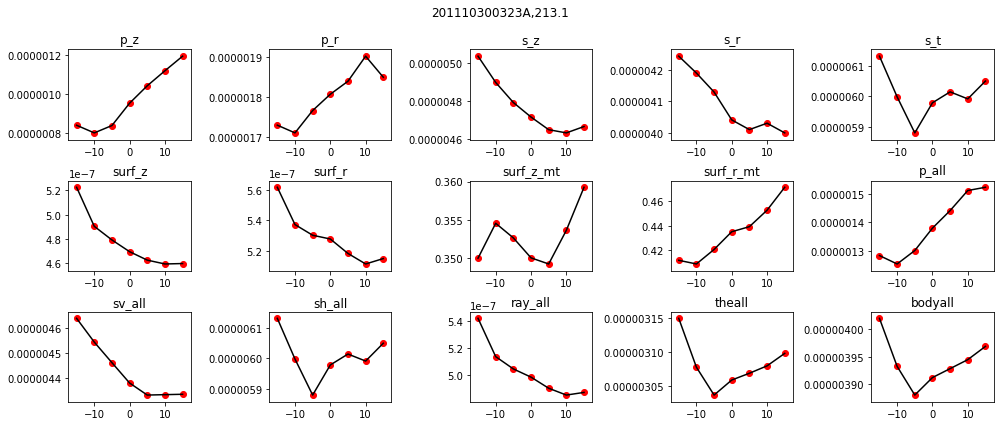

['d-15(198.1)', 'd-10(203.1)', 'd-5(208.1)', 'd0(213.1)', 'd5(218.1)', 'd10(223.1)', 'd15(228.1)']


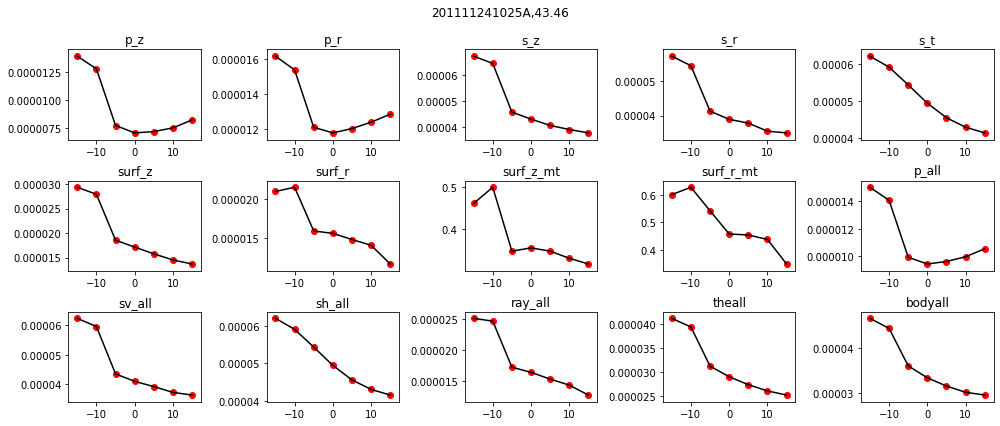

['d-15(28.46)', 'd-10(33.46)', 'd-5(38.46)', 'd0(43.46)', 'd5(48.46)', 'd10(53.46)', 'd15(58.46)']


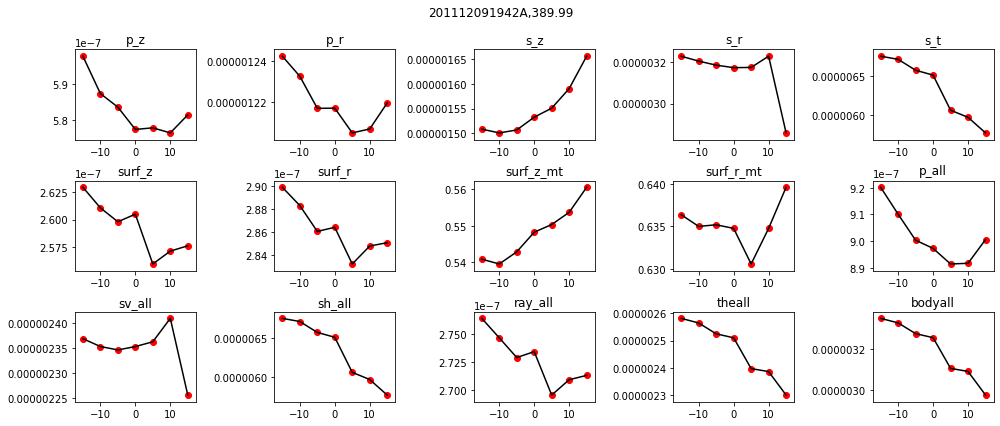

['d-15(374.99)', 'd-10(379.99)', 'd-5(384.99)', 'd0(389.99)', 'd5(394.99)', 'd10(399.99)', 'd15(404.99)']


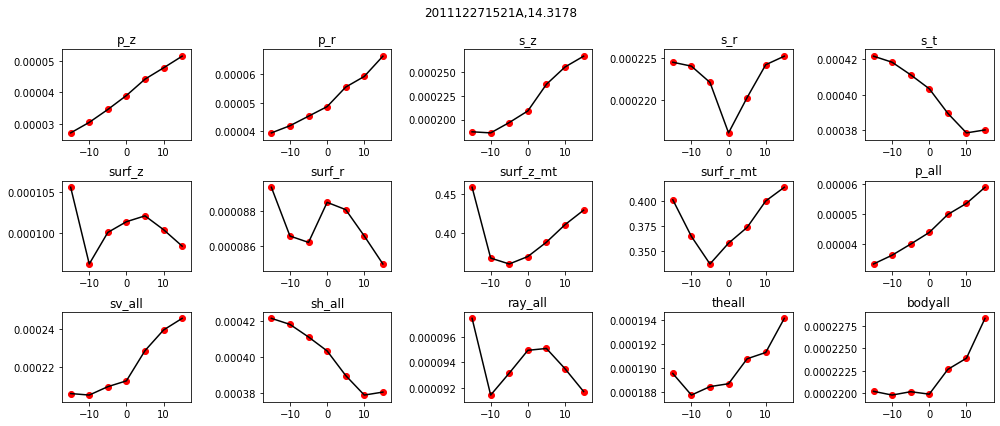

['d-15(5.0)', 'd-10(8.105933333333333)', 'd-5(11.211866666666666)', 'd0(14.3178)', 'd5(19.3178)', 'd10(24.3178)', 'd15(29.3178)']


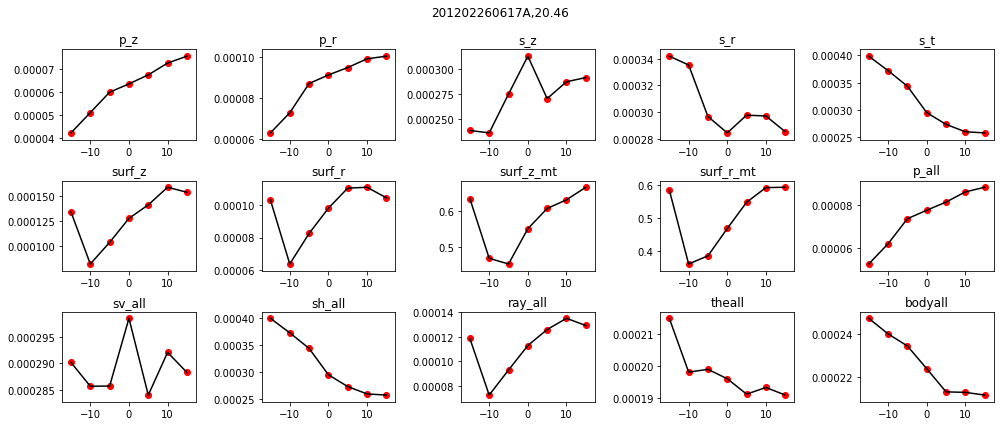

['d-15(5.460000000000001)', 'd-10(10.46)', 'd-5(15.46)', 'd0(20.46)', 'd5(25.46)', 'd10(30.46)', 'd15(35.46)']


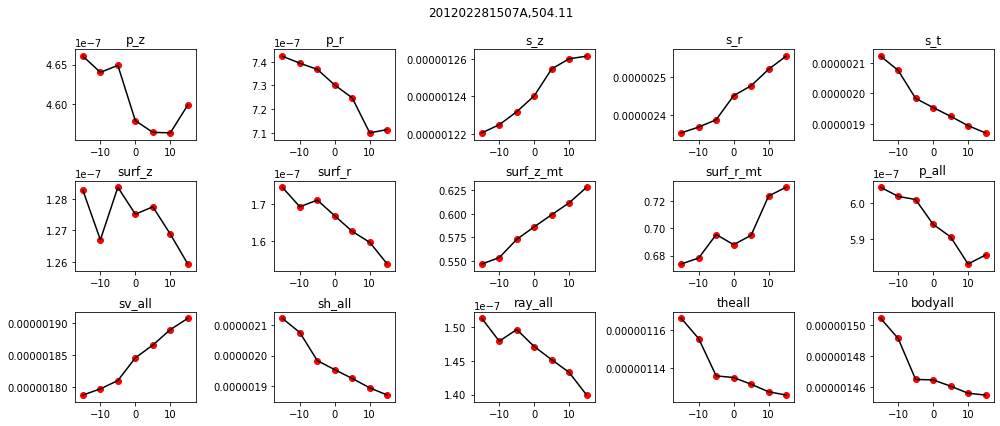

['d-15(489.11)', 'd-10(494.11)', 'd-5(499.11)', 'd0(504.11)', 'd5(509.11)', 'd10(514.11)', 'd15(519.11)']


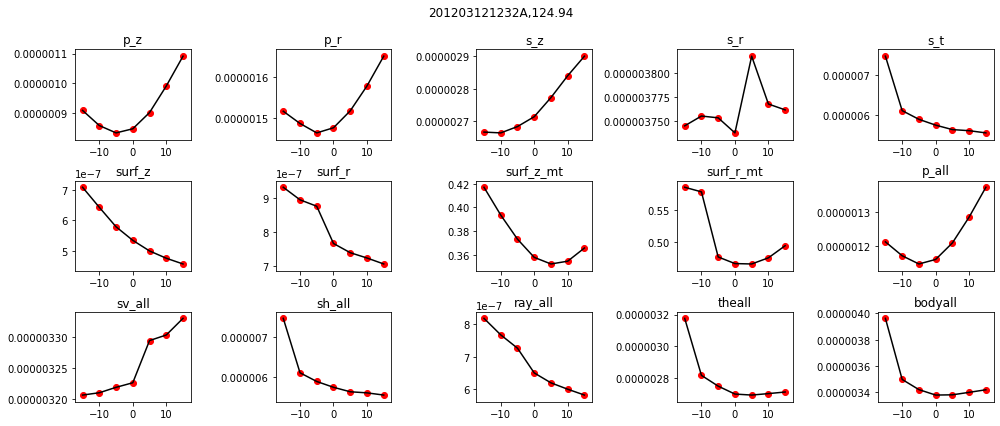

['d-15(109.94)', 'd-10(114.94)', 'd-5(119.94)', 'd0(124.94)', 'd5(129.94)', 'd10(134.94)', 'd15(139.94)']


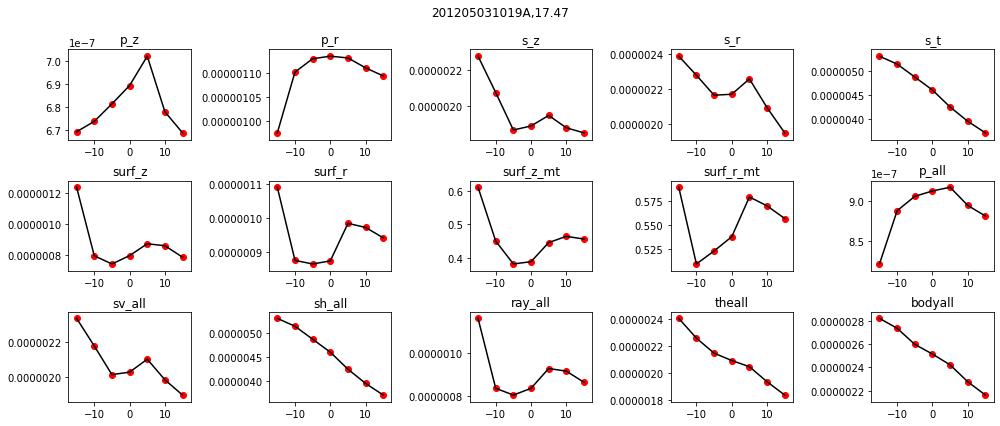

['d-15(5.0)', 'd-10(9.156666666666666)', 'd-5(13.313333333333333)', 'd0(17.47)', 'd5(22.47)', 'd10(27.47)', 'd15(32.47)']


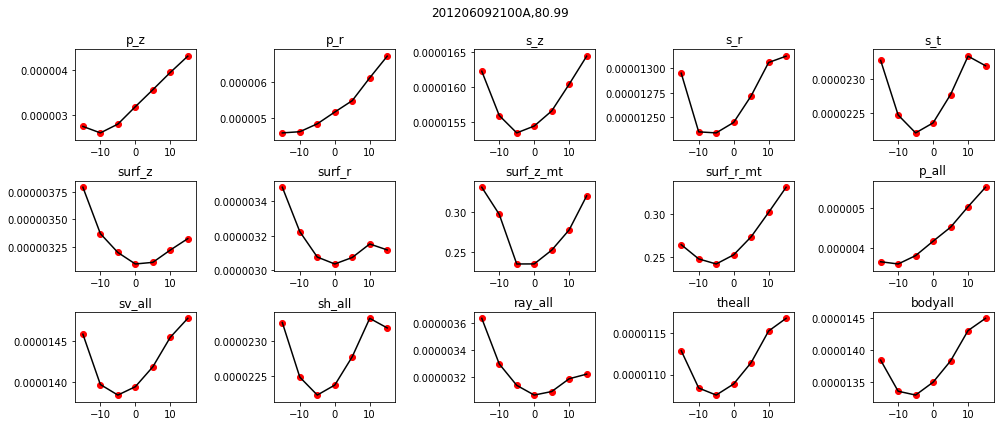

['d-15(65.99)', 'd-10(70.99)', 'd-5(75.99)', 'd0(80.99)', 'd5(85.99)', 'd10(90.99)', 'd15(95.99)']


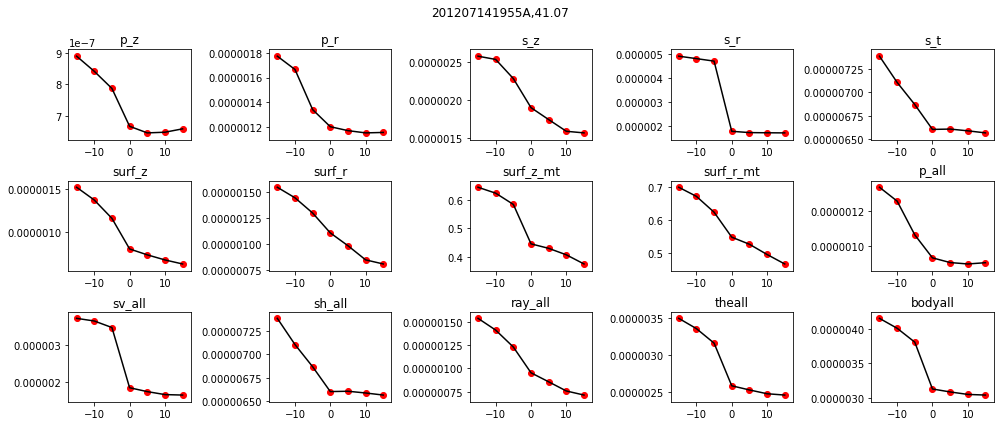

['d-15(26.07)', 'd-10(31.07)', 'd-5(36.07)', 'd0(41.07)', 'd5(46.07)', 'd10(51.07)', 'd15(56.07)']


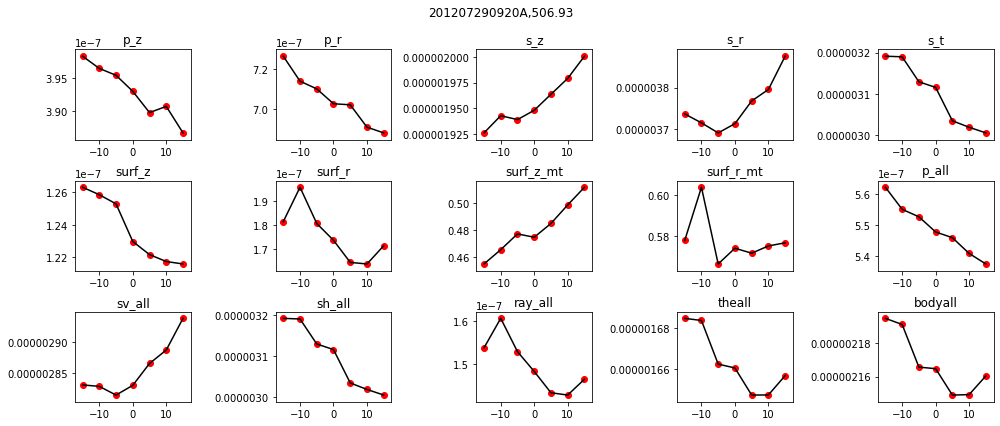

['d-15(491.93)', 'd-10(496.93)', 'd-5(501.93)', 'd0(506.93)', 'd5(511.93)', 'd10(516.9300000000001)', 'd15(521.9300000000001)']


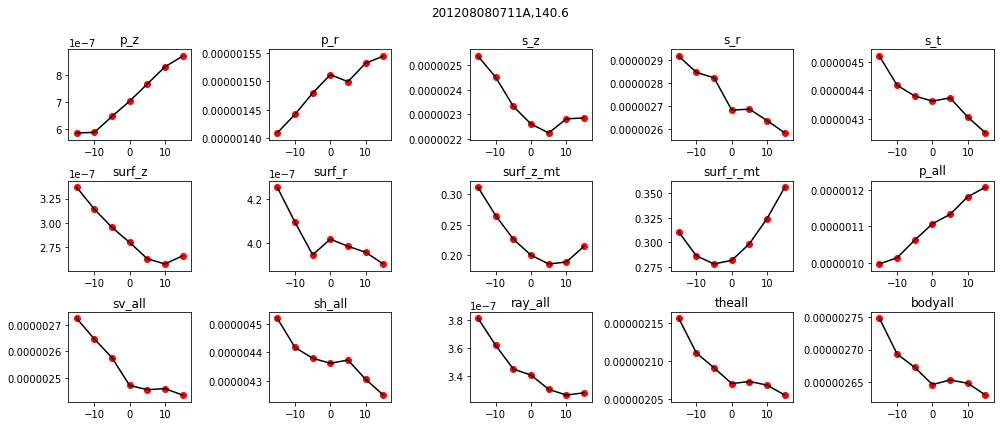

['d-15(125.6)', 'd-10(130.6)', 'd-5(135.6)', 'd0(140.6)', 'd5(145.6)', 'd10(150.6)', 'd15(155.6)']


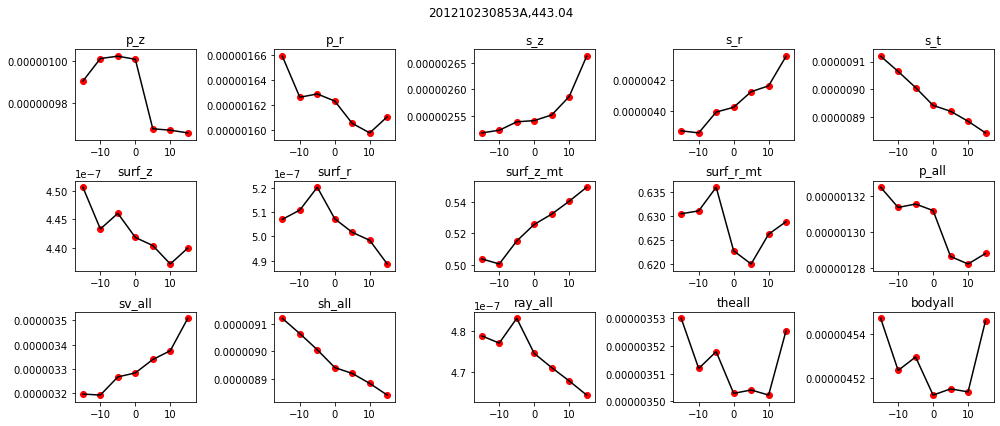

['d-15(428.04)', 'd-10(433.04)', 'd-5(438.04)', 'd0(443.04)', 'd5(448.04)', 'd10(453.04)', 'd15(458.04)']


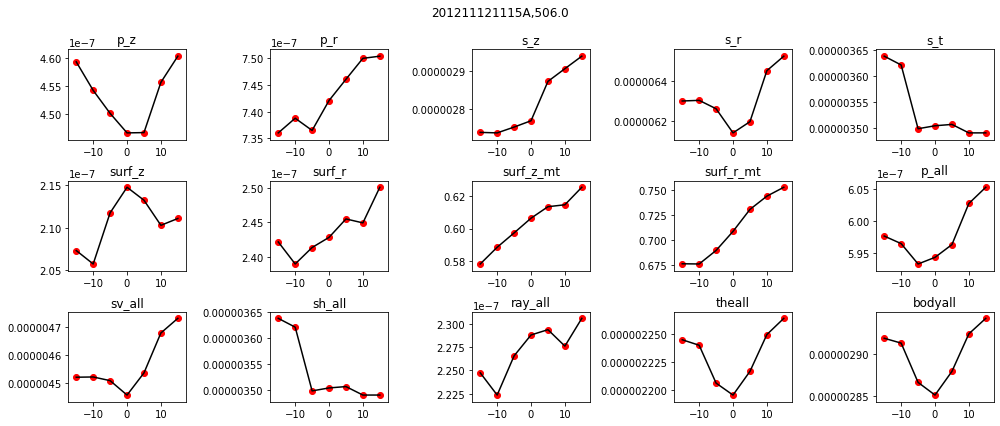

['d-15(491.0)', 'd-10(496.0)', 'd-5(501.0)', 'd0(506.0)', 'd5(511.0)', 'd10(516.0)', 'd15(521.0)']


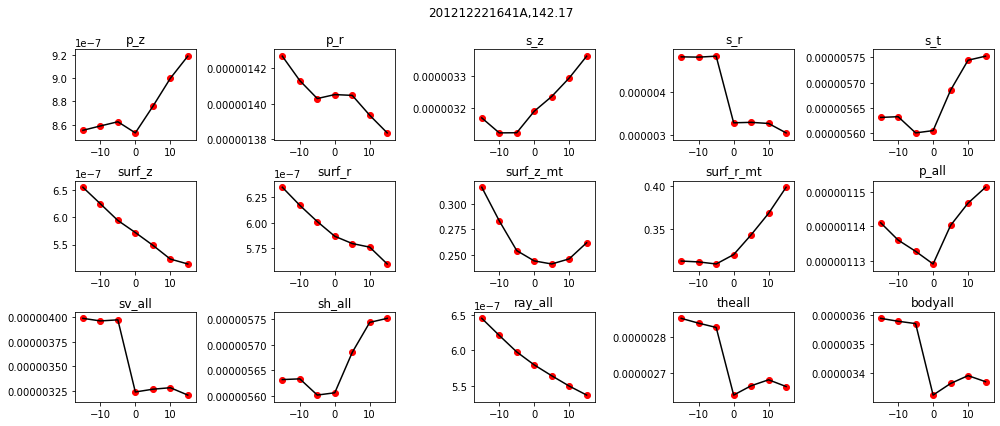

['d-15(127.16999999999999)', 'd-10(132.17)', 'd-5(137.17)', 'd0(142.17)', 'd5(147.17)', 'd10(152.17)', 'd15(157.17)']


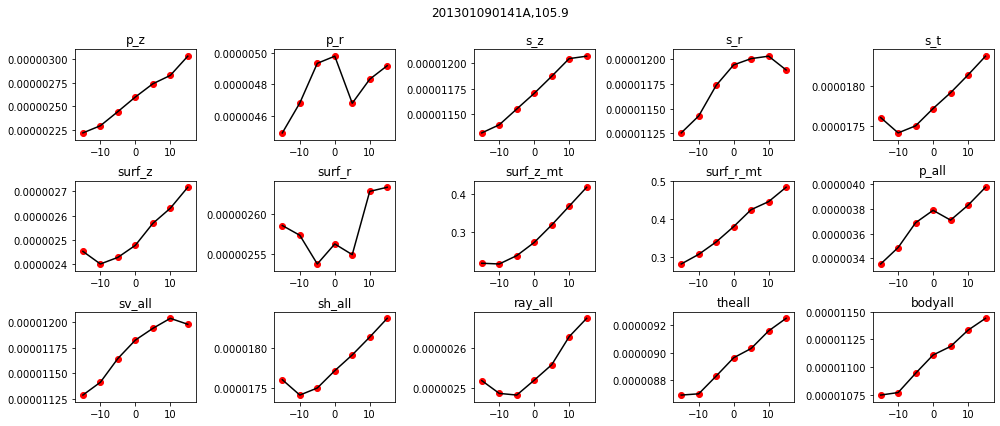

['d-15(90.9)', 'd-10(95.9)', 'd-5(100.9)', 'd0(105.9)', 'd5(110.9)', 'd10(115.9)', 'd15(120.9)']


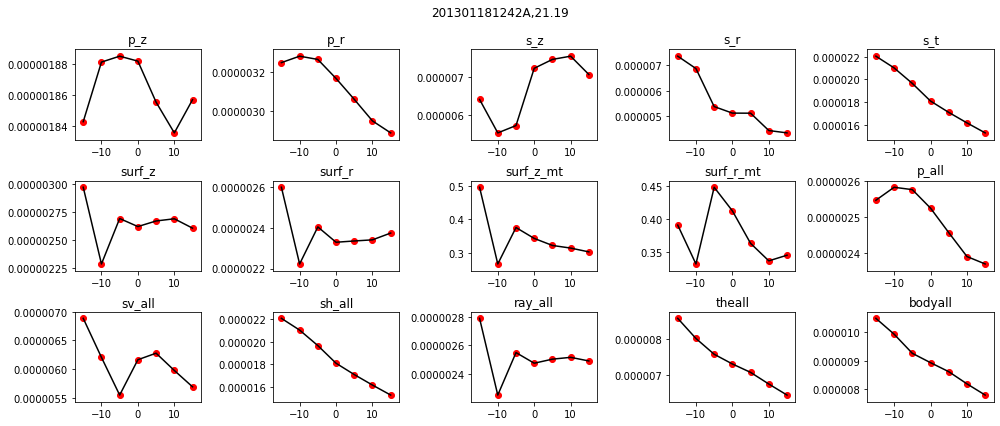

['d-15(6.190000000000001)', 'd-10(11.190000000000001)', 'd-5(16.19)', 'd0(21.19)', 'd5(26.19)', 'd10(31.19)', 'd15(36.19)']


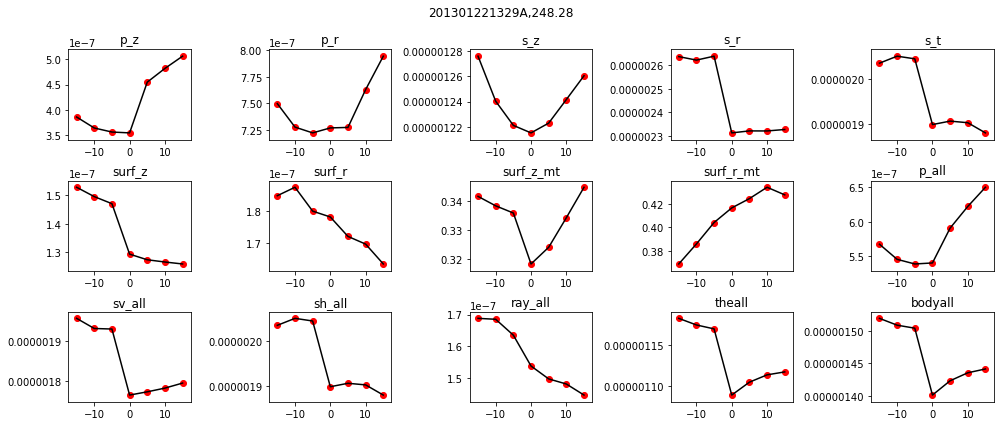

['d-15(233.28)', 'd-10(238.28)', 'd-5(243.28)', 'd0(248.28)', 'd5(253.28)', 'd10(258.28)', 'd15(263.28)']


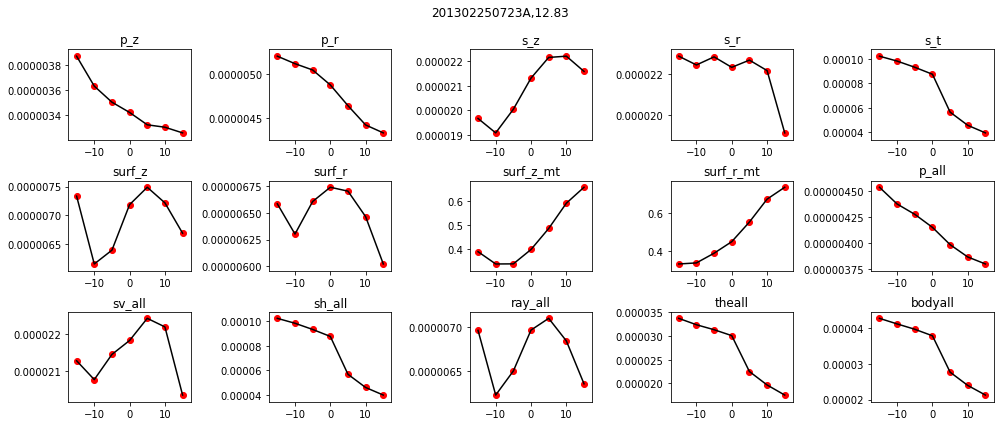

['d-15(5.0)', 'd-10(7.609999999999999)', 'd-5(10.219999999999999)', 'd0(12.83)', 'd5(17.83)', 'd10(22.83)', 'd15(27.83)']


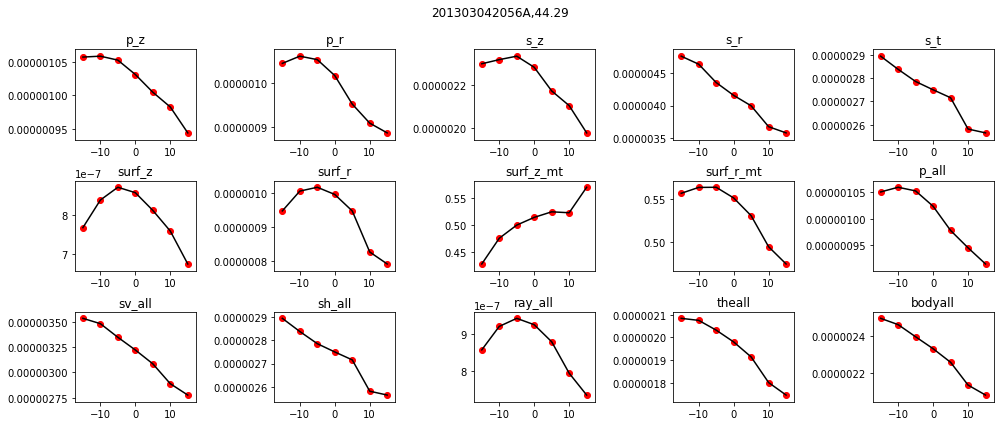

['d-15(29.29)', 'd-10(34.29)', 'd-5(39.29)', 'd0(44.29)', 'd5(49.29)', 'd10(54.29)', 'd15(59.29)']


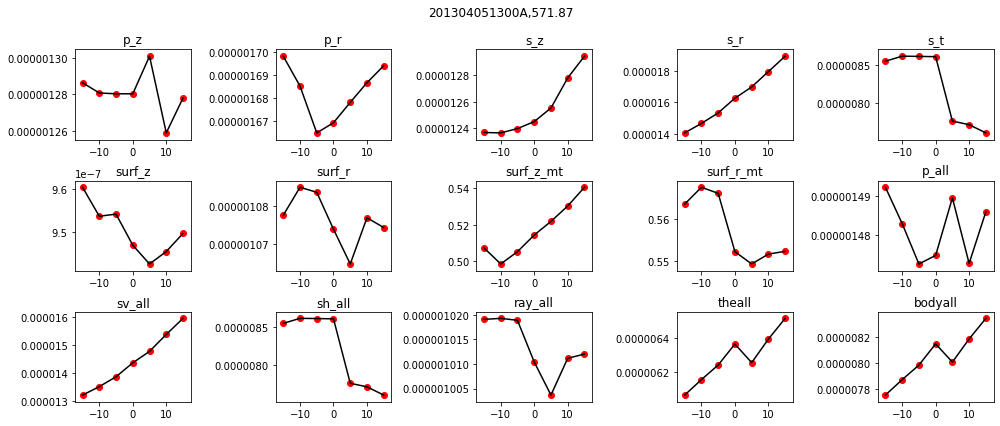

['d-15(556.87)', 'd-10(561.87)', 'd-5(566.87)', 'd0(571.87)', 'd5(576.87)', 'd10(581.87)', 'd15(586.87)']


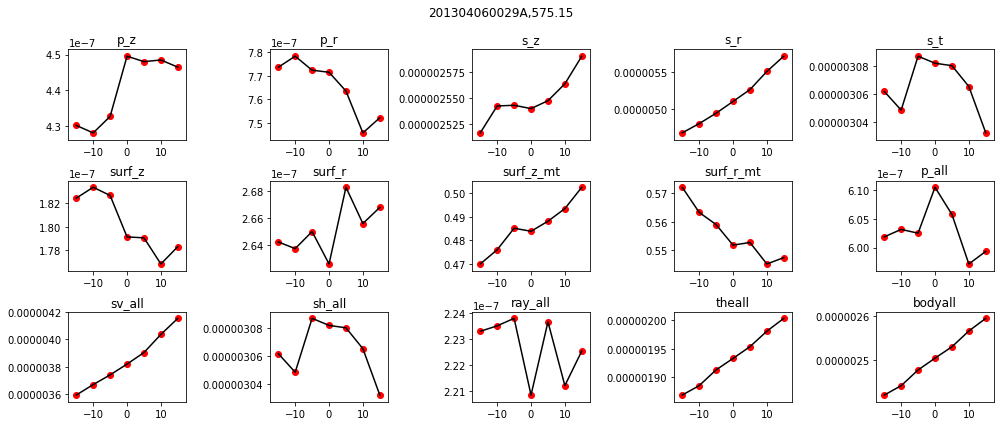

['d-15(560.15)', 'd-10(565.15)', 'd-5(570.15)', 'd0(575.15)', 'd5(580.15)', 'd10(585.15)', 'd15(590.15)']


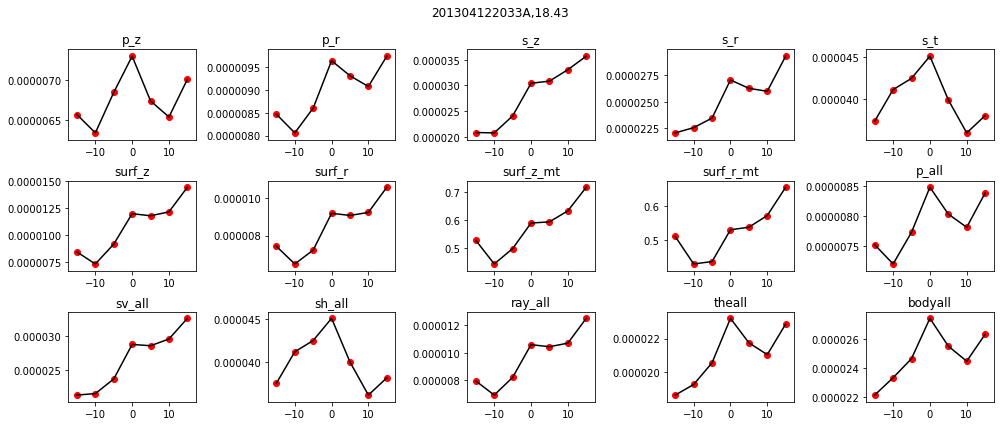

['d-15(5.0)', 'd-10(9.476666666666667)', 'd-5(13.953333333333333)', 'd0(18.43)', 'd5(23.43)', 'd10(28.43)', 'd15(33.43)']


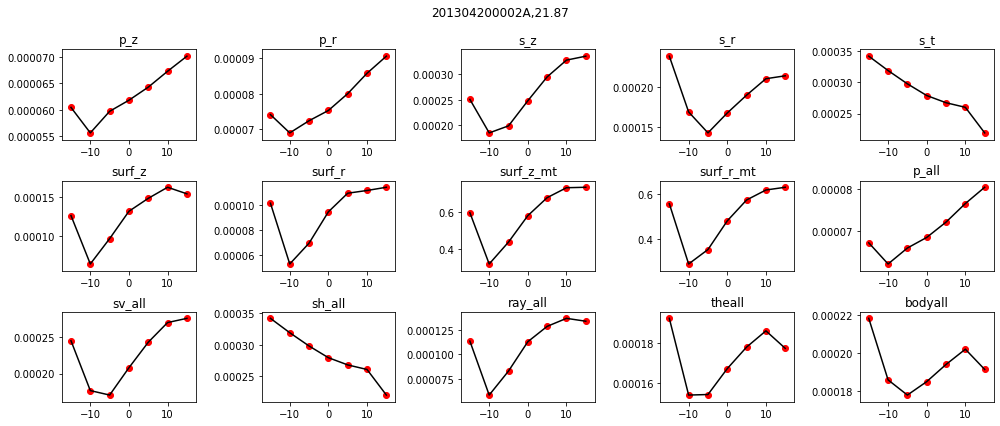

['d-15(6.870000000000001)', 'd-10(11.870000000000001)', 'd-5(16.87)', 'd0(21.87)', 'd5(26.87)', 'd10(31.87)', 'd15(36.870000000000005)']


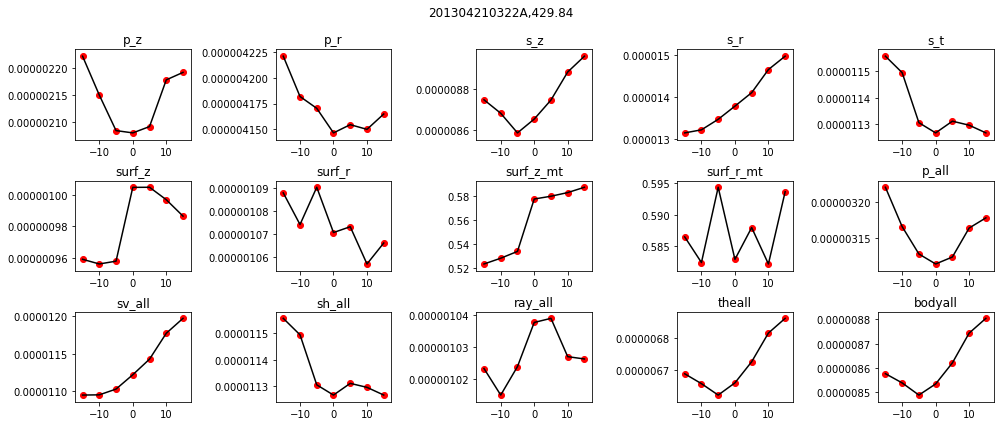

['d-15(414.84)', 'd-10(419.84)', 'd-5(424.84)', 'd0(429.84)', 'd5(434.84)', 'd10(439.84)', 'd15(444.84)']


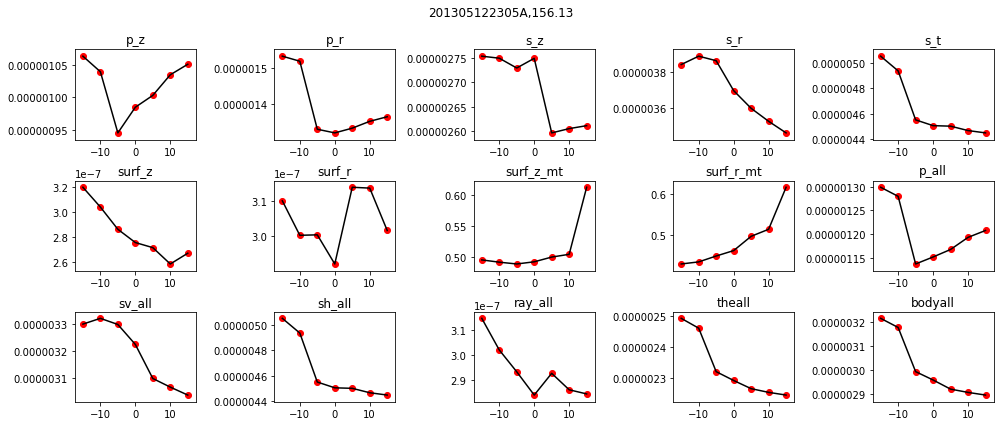

['d-15(141.13)', 'd-10(146.13)', 'd-5(151.13)', 'd0(156.13)', 'd5(161.13)', 'd10(166.13)', 'd15(171.13)']


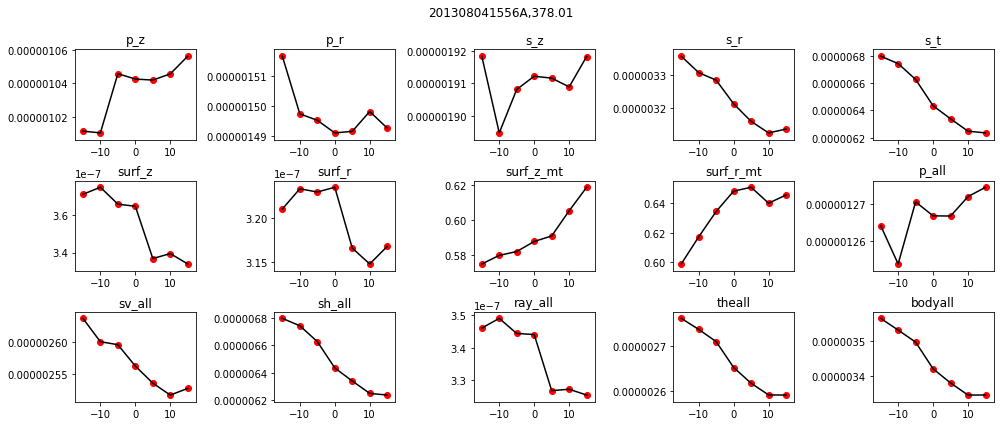

['d-15(363.01)', 'd-10(368.01)', 'd-5(373.01)', 'd0(378.01)', 'd5(383.01)', 'd10(388.01)', 'd15(393.01)']


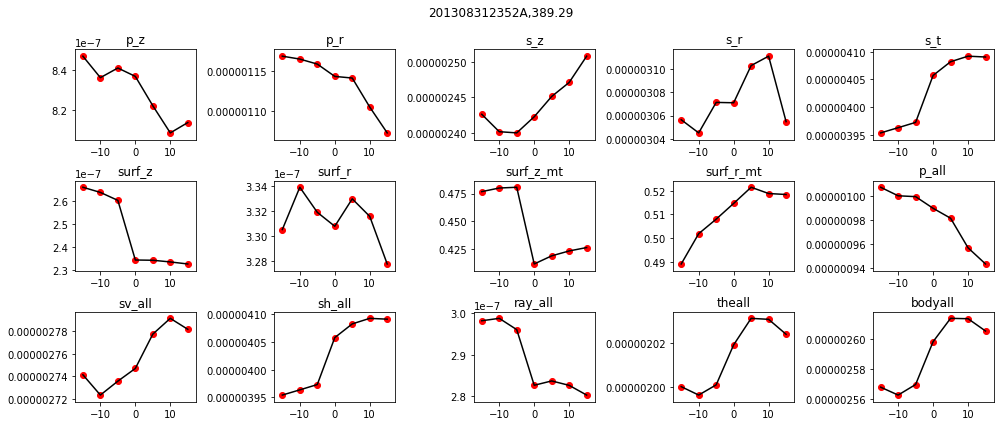

['d-15(374.29)', 'd-10(379.29)', 'd-5(384.29)', 'd0(389.29)', 'd5(394.29)', 'd10(399.29)', 'd15(404.29)']


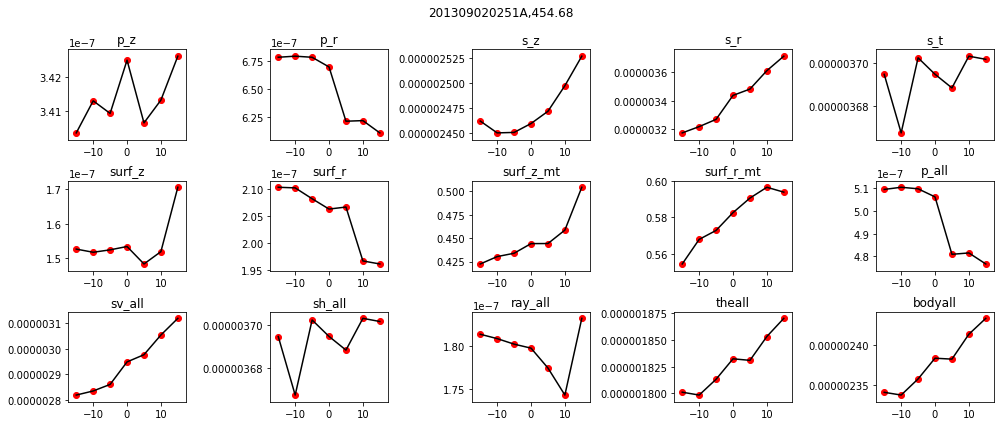

['d-15(439.68)', 'd-10(444.68)', 'd-5(449.68)', 'd0(454.68)', 'd5(459.68)', 'd10(464.68)', 'd15(469.68)']


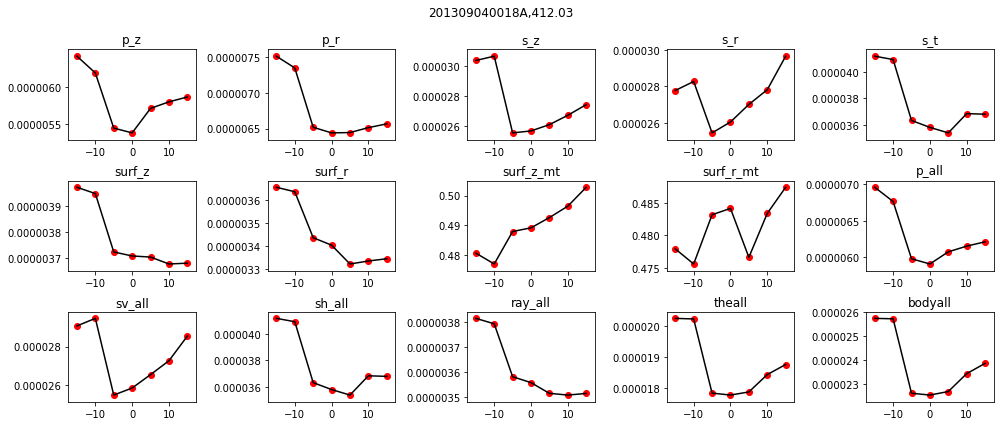

['d-15(397.03)', 'd-10(402.03)', 'd-5(407.03)', 'd0(412.03)', 'd5(417.03)', 'd10(422.03)', 'd15(427.03)']


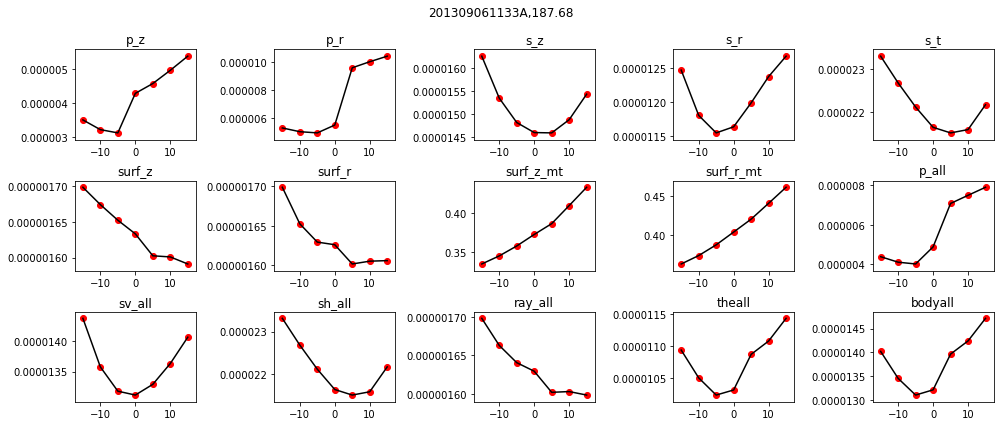

['d-15(172.68)', 'd-10(177.68)', 'd-5(182.68)', 'd0(187.68)', 'd5(192.68)', 'd10(197.68)', 'd15(202.68)']


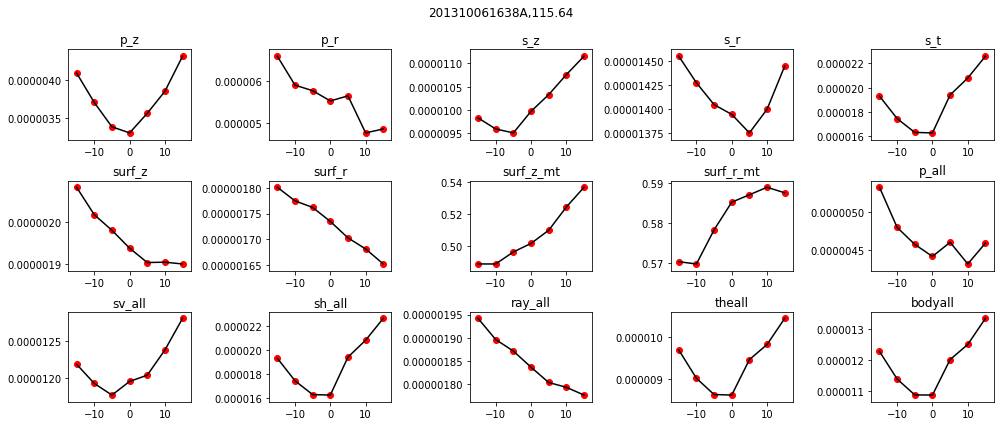

['d-15(100.64)', 'd-10(105.64)', 'd-5(110.64)', 'd0(115.64)', 'd5(120.64)', 'd10(125.64)', 'd15(130.64)']


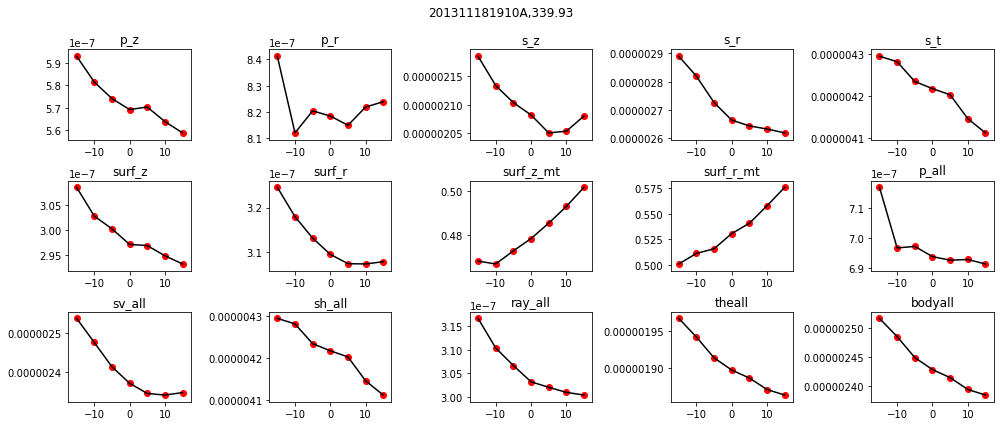

['d-15(324.93)', 'd-10(329.93)', 'd-5(334.93)', 'd0(339.93)', 'd5(344.93)', 'd10(349.93)', 'd15(354.93)']


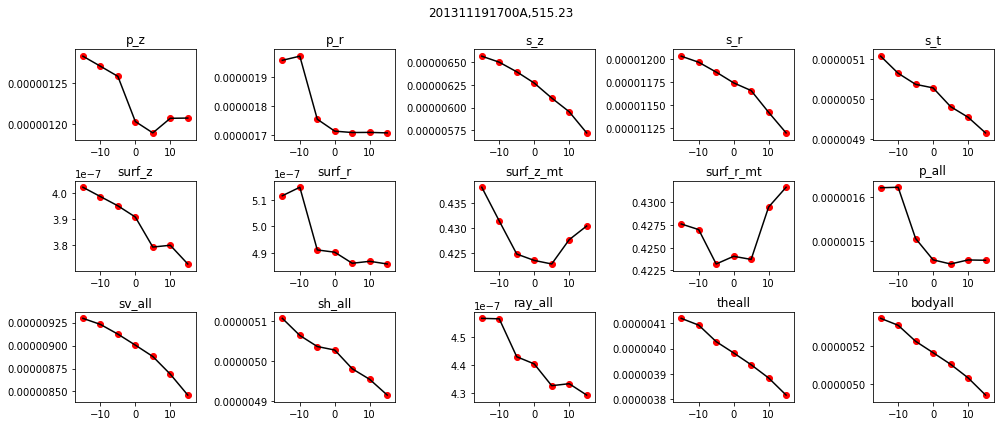

['d-15(500.23)', 'd-10(505.23)', 'd-5(510.23)', 'd0(515.23)', 'd5(520.23)', 'd10(525.23)', 'd15(530.23)']


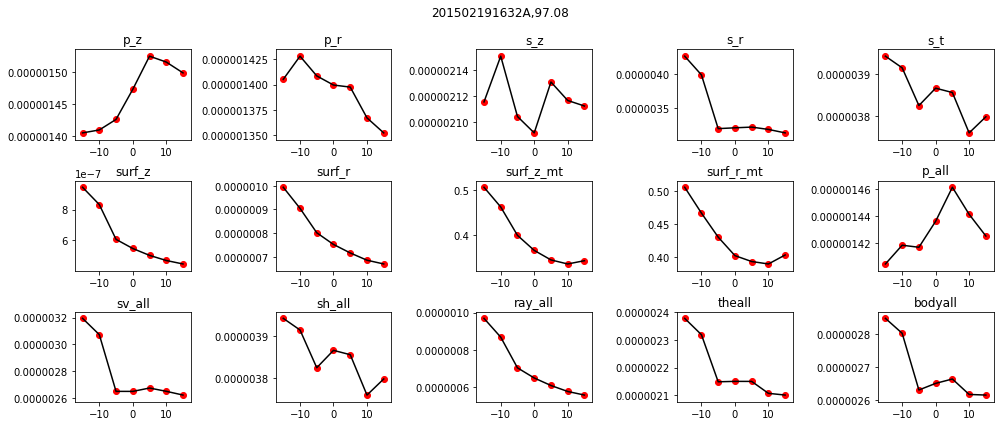

['d-15(82.08)', 'd-10(87.08)', 'd-5(92.08)', 'd0(97.08)', 'd5(102.08)', 'd10(107.08)', 'd15(112.08)']


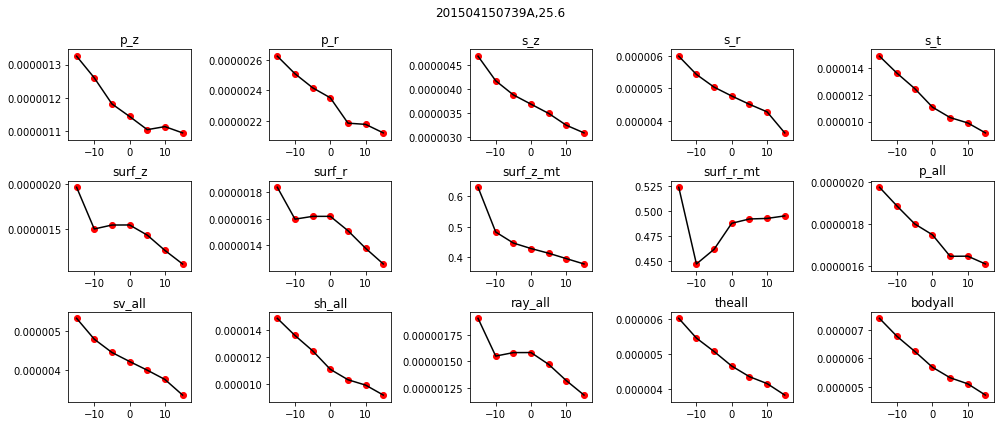

['d-15(10.600000000000001)', 'd-10(15.600000000000001)', 'd-5(20.6)', 'd0(25.6)', 'd5(30.6)', 'd10(35.6)', 'd15(40.6)']


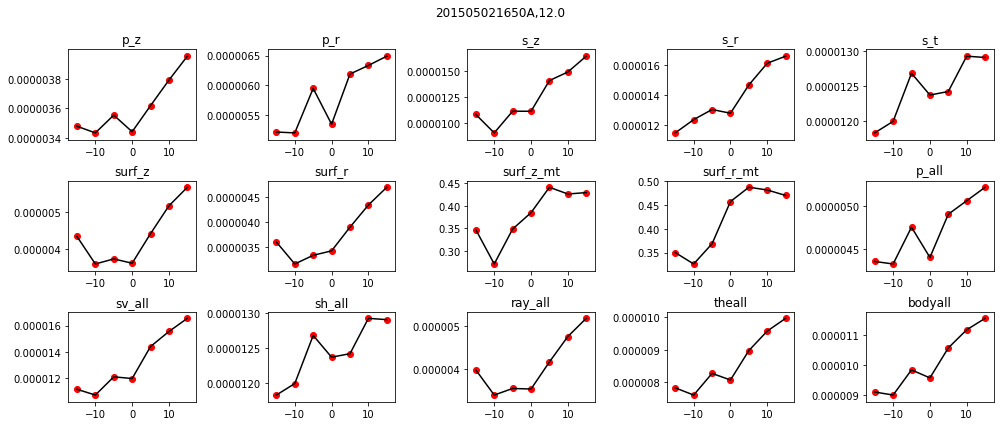

['d-15(5.0)', 'd-10(7.333333333333334)', 'd-5(9.666666666666668)', 'd0(12.0)', 'd5(17.0)', 'd10(22.0)', 'd15(27.0)']


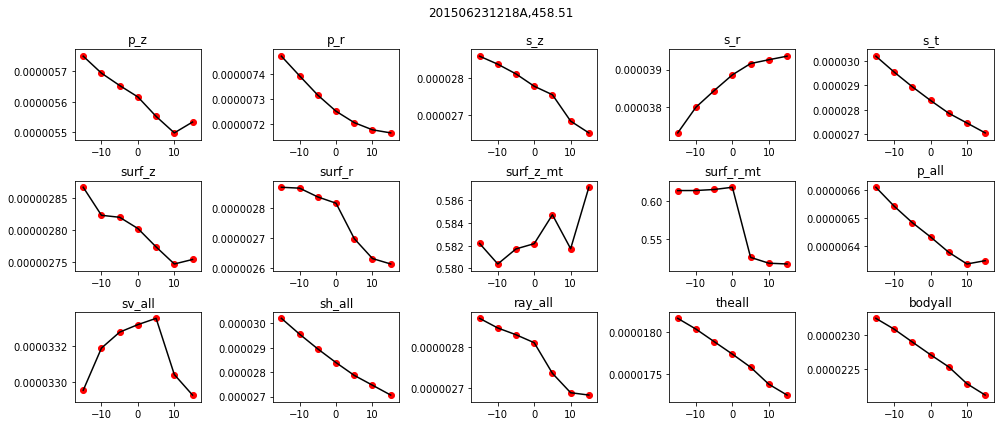

['d-15(443.51)', 'd-10(448.51)', 'd-5(453.51)', 'd0(458.51)', 'd5(463.51)', 'd10(468.51)', 'd15(473.51)']


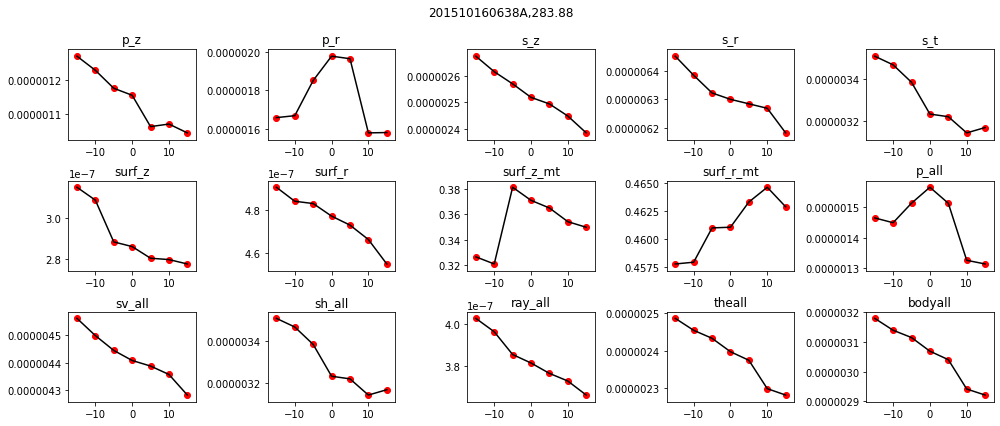

['d-15(268.88)', 'd-10(273.88)', 'd-5(278.88)', 'd0(283.88)', 'd5(288.88)', 'd10(293.88)', 'd15(298.88)']


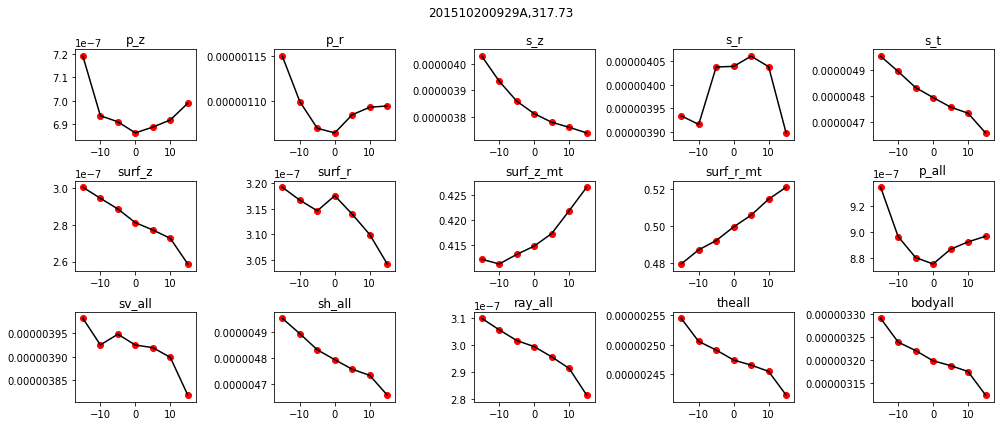

['d-15(302.73)', 'd-10(307.73)', 'd-5(312.73)', 'd0(317.73)', 'd5(322.73)', 'd10(327.73)', 'd15(332.73)']


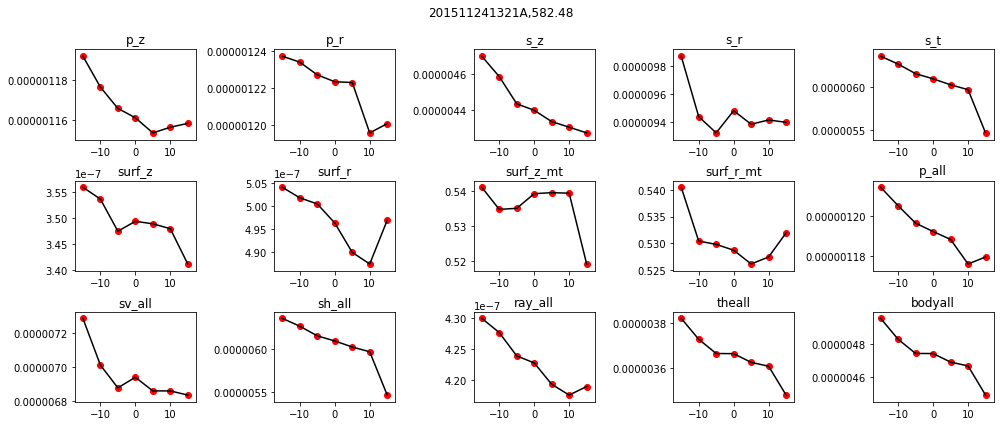

['d-15(567.48)', 'd-10(572.48)', 'd-5(577.48)', 'd0(582.48)', 'd5(587.48)', 'd10(592.48)', 'd15(597.48)']


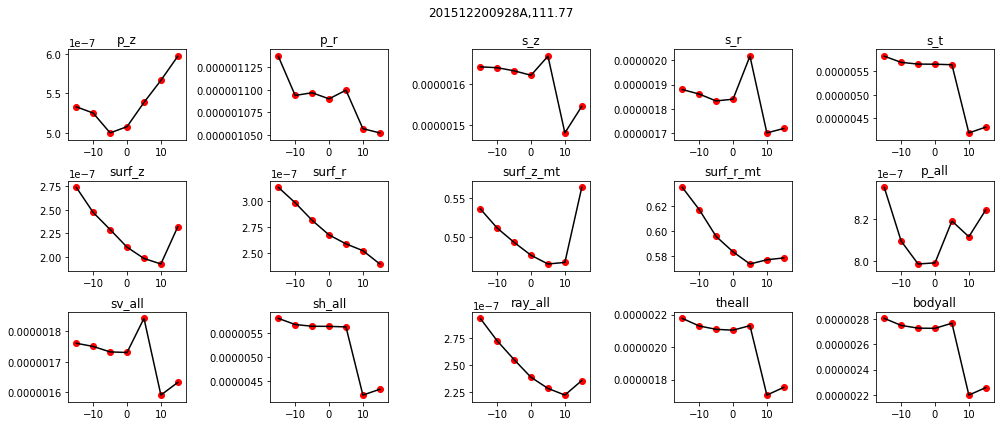

['d-15(96.77)', 'd-10(101.77)', 'd-5(106.77)', 'd0(111.77)', 'd5(116.77)', 'd10(121.77)', 'd15(126.77)']


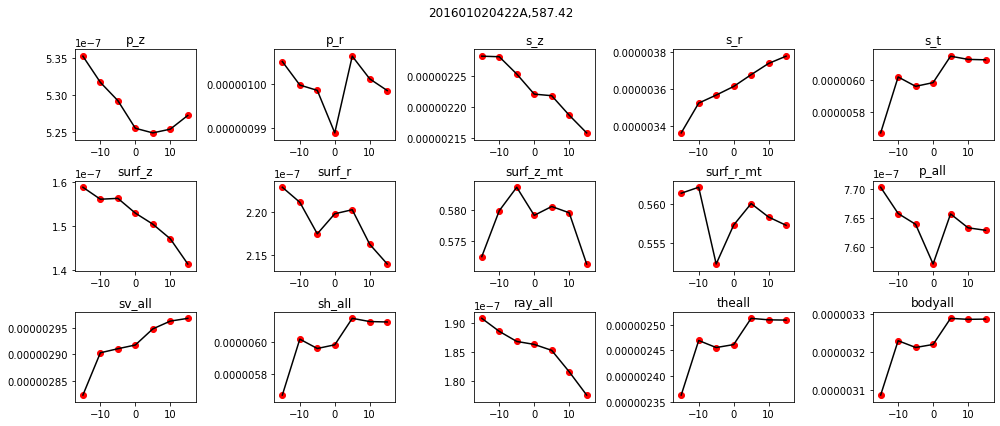

['d-15(572.42)', 'd-10(577.42)', 'd-5(582.42)', 'd0(587.42)', 'd5(592.42)', 'd10(597.42)', 'd15(602.42)']


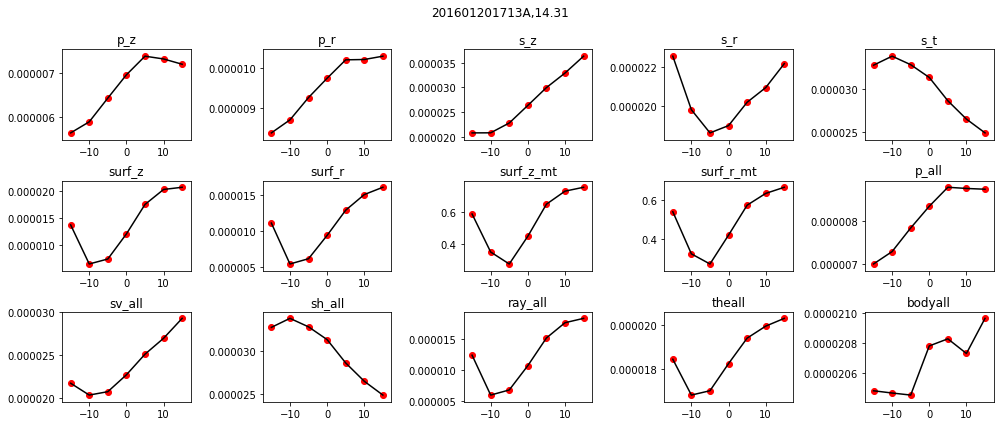

['d-15(5.0)', 'd-10(8.103333333333333)', 'd-5(11.206666666666667)', 'd0(14.31)', 'd5(19.310000000000002)', 'd10(24.310000000000002)', 'd15(29.310000000000002)']


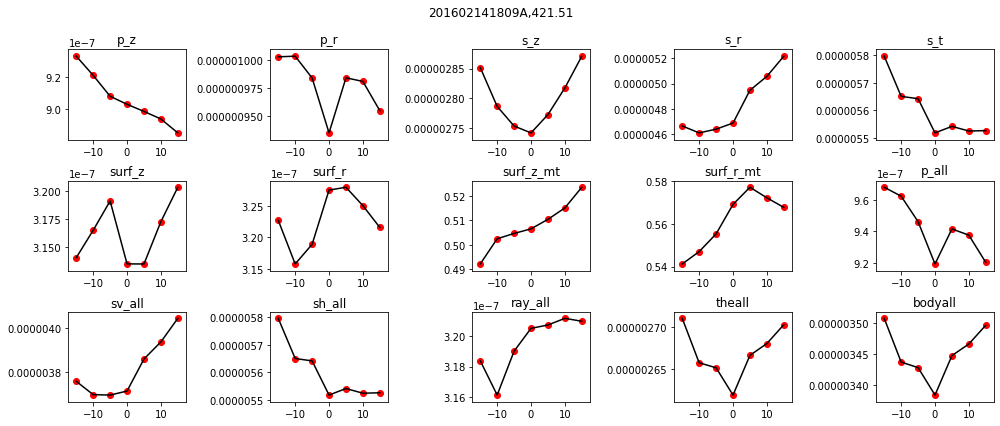

['d-15(406.51)', 'd-10(411.51)', 'd-5(416.51)', 'd0(421.51)', 'd5(426.51)', 'd10(431.51)', 'd15(436.51)']


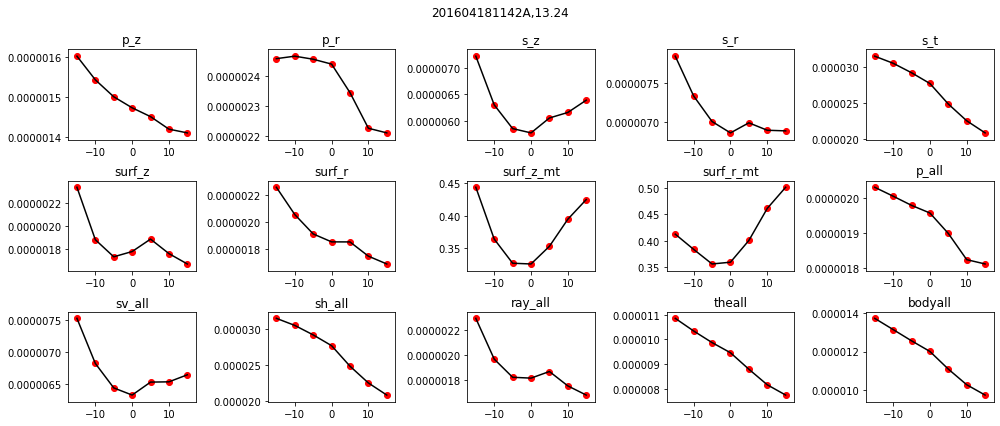

['d-15(5.0)', 'd-10(7.746666666666666)', 'd-5(10.493333333333332)', 'd0(13.24)', 'd5(18.240000000000002)', 'd10(23.240000000000002)', 'd15(28.240000000000002)']


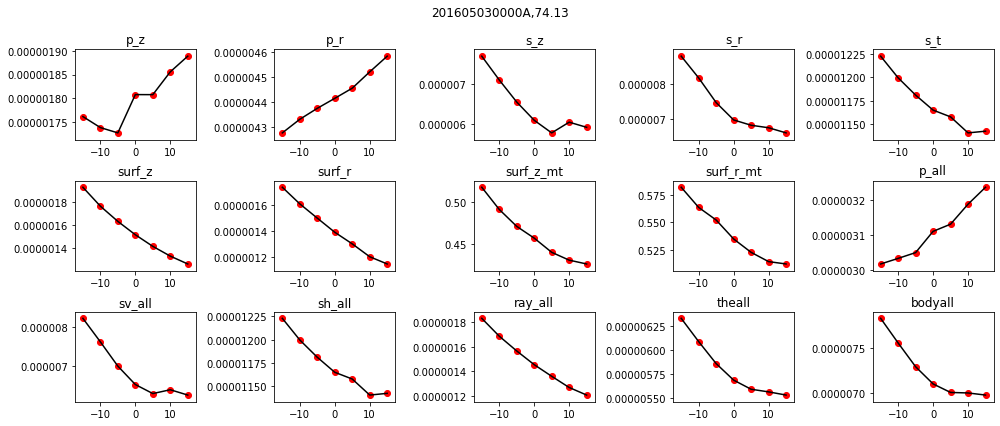

['d-15(59.129999999999995)', 'd-10(64.13)', 'd-5(69.13)', 'd0(74.13)', 'd5(79.13)', 'd10(84.13)', 'd15(89.13)']


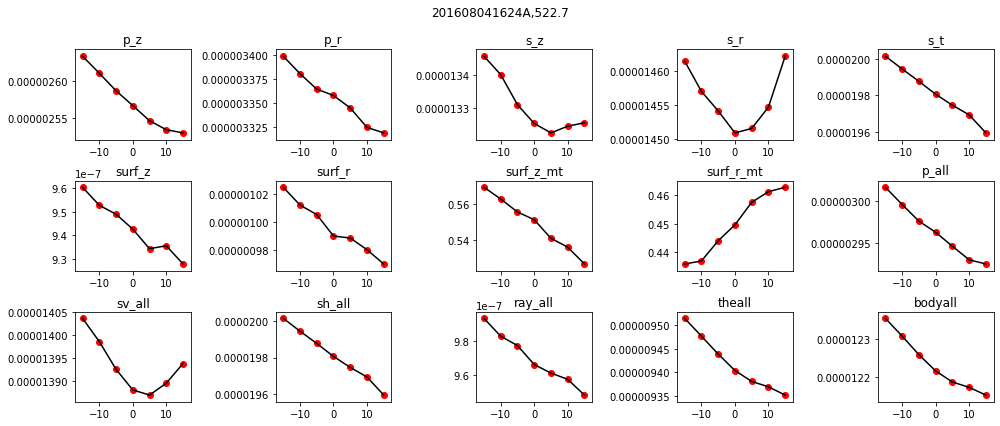

['d-15(507.70000000000005)', 'd-10(512.7)', 'd-5(517.7)', 'd0(522.7)', 'd5(527.7)', 'd10(532.7)', 'd15(537.7)']


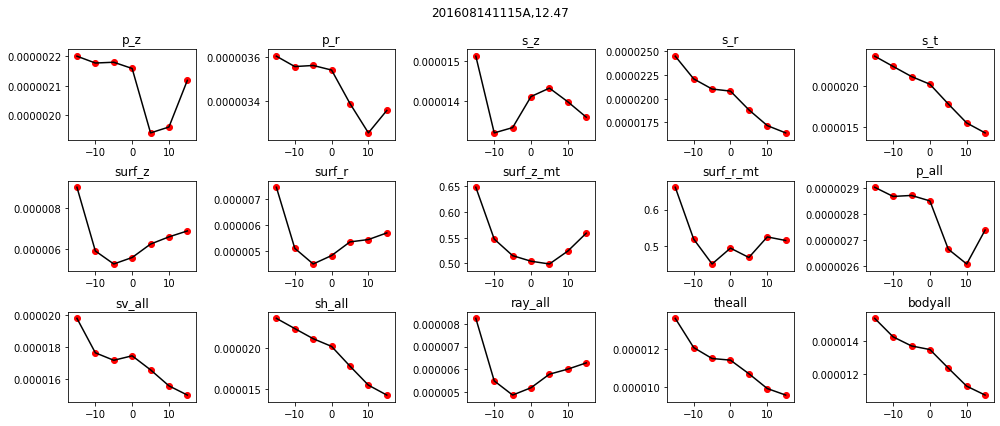

['d-15(5.0)', 'd-10(7.49)', 'd-5(9.98)', 'd0(12.47)', 'd5(17.47)', 'd10(22.47)', 'd15(27.47)']


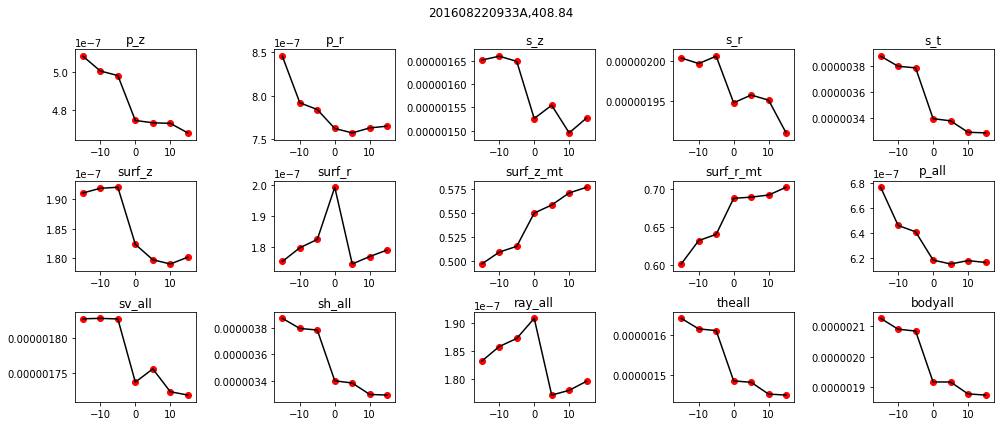

['d-15(393.84)', 'd-10(398.84)', 'd-5(403.84)', 'd0(408.84)', 'd5(413.84)', 'd10(418.84)', 'd15(423.84)']


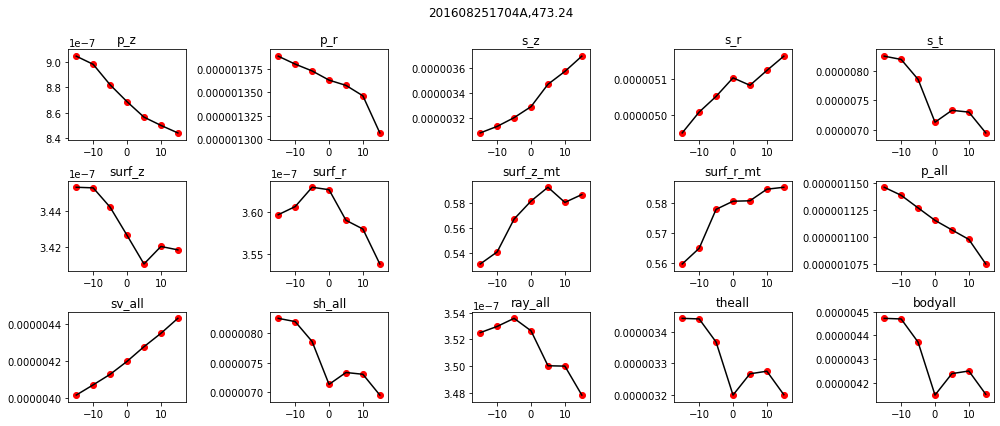

['d-15(458.24)', 'd-10(463.24)', 'd-5(468.24)', 'd0(473.24)', 'd5(478.24)', 'd10(483.24)', 'd15(488.24)']


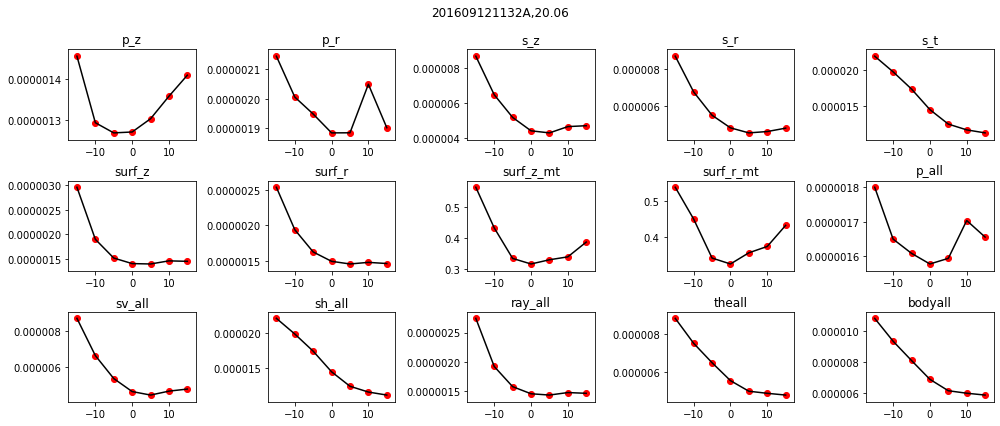

['d-15(5.059999999999999)', 'd-10(10.059999999999999)', 'd-5(15.059999999999999)', 'd0(20.06)', 'd5(25.06)', 'd10(30.06)', 'd15(35.06)']


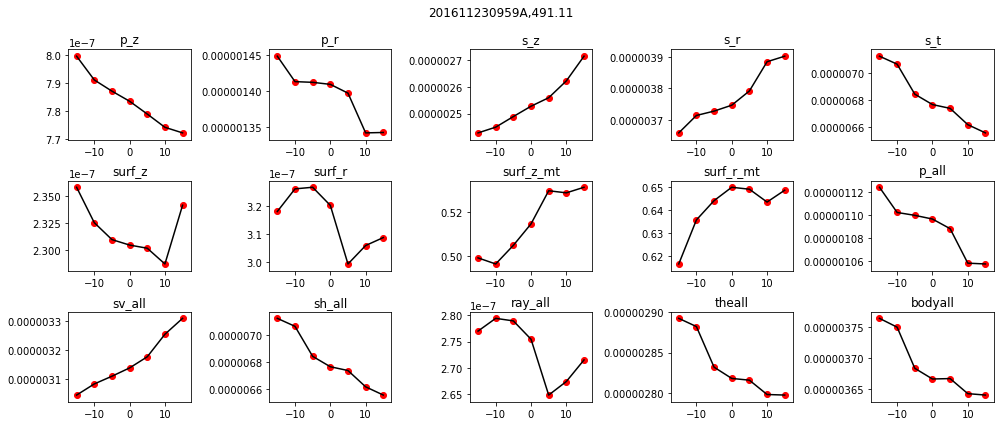

['d-15(476.11)', 'd-10(481.11)', 'd-5(486.11)', 'd0(491.11)', 'd5(496.11)', 'd10(501.11)', 'd15(506.11)']


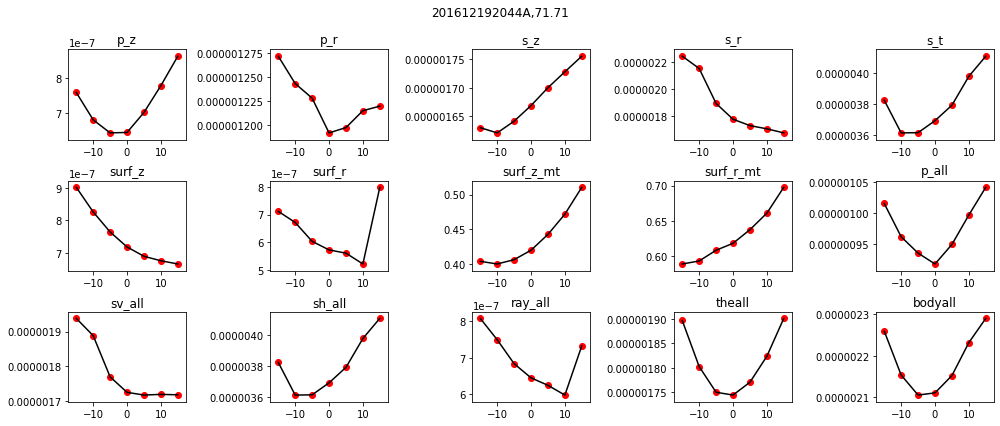

['d-15(56.709999999999994)', 'd-10(61.709999999999994)', 'd-5(66.71)', 'd0(71.71)', 'd5(76.71)', 'd10(81.71)', 'd15(86.71)']


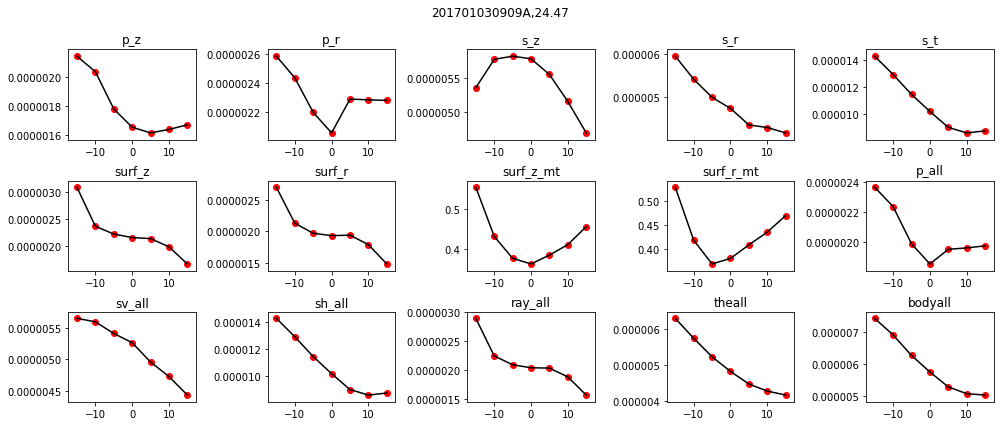

['d-15(9.469999999999999)', 'd-10(14.469999999999999)', 'd-5(19.47)', 'd0(24.47)', 'd5(29.47)', 'd10(34.47)', 'd15(39.47)']


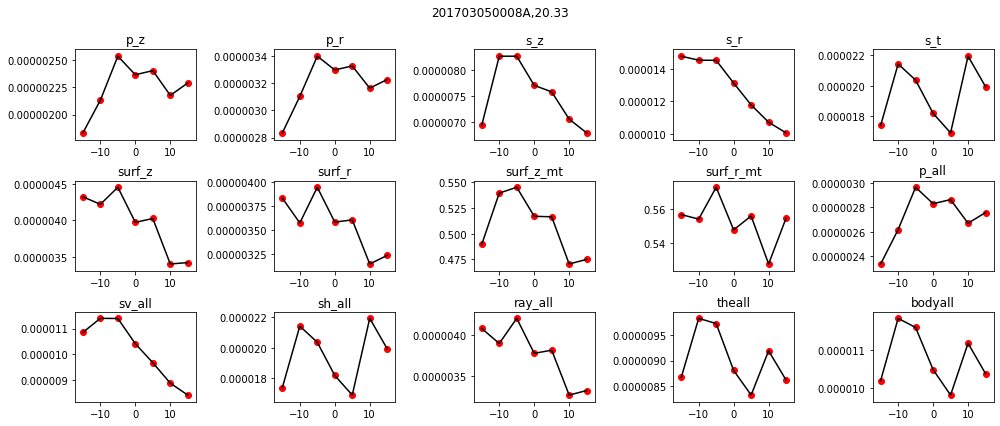

['d-15(5.329999999999998)', 'd-10(10.329999999999998)', 'd-5(15.329999999999998)', 'd0(20.33)', 'd5(25.33)', 'd10(30.33)', 'd15(35.33)']


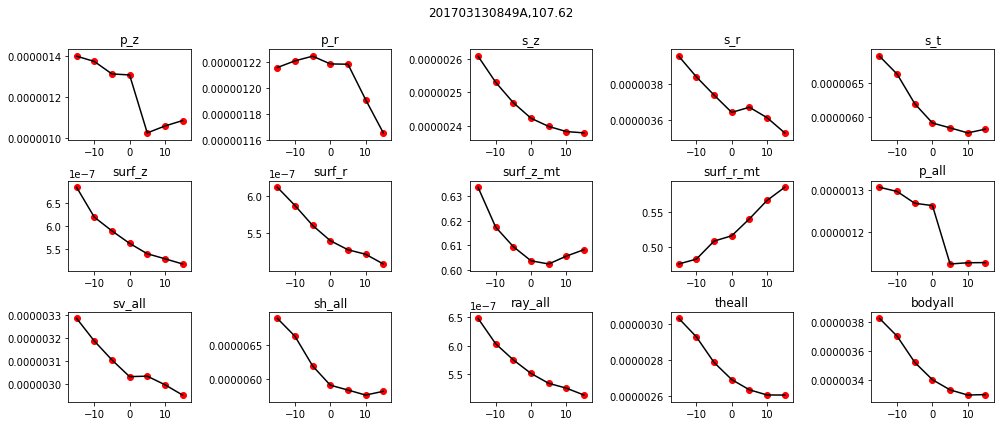

['d-15(92.62)', 'd-10(97.62)', 'd-5(102.62)', 'd0(107.62)', 'd5(112.62)', 'd10(117.62)', 'd15(122.62)']


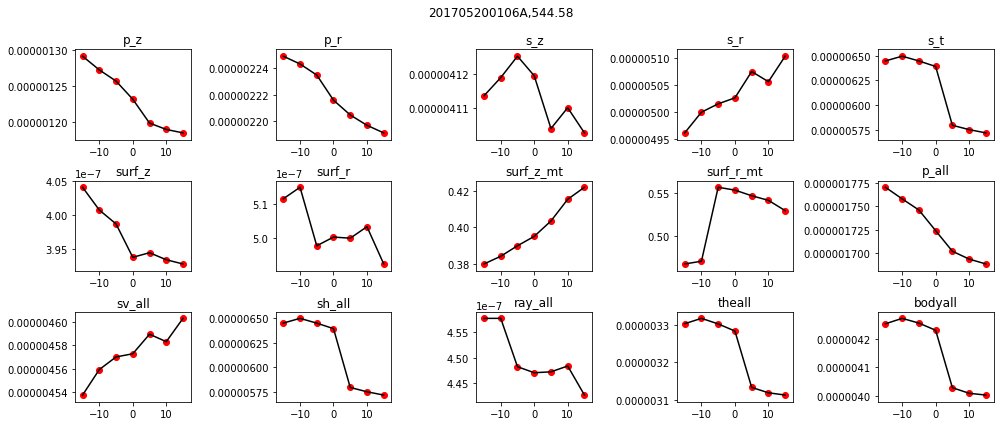

['d-15(529.58)', 'd-10(534.58)', 'd-5(539.58)', 'd0(544.58)', 'd5(549.58)', 'd10(554.58)', 'd15(559.58)']


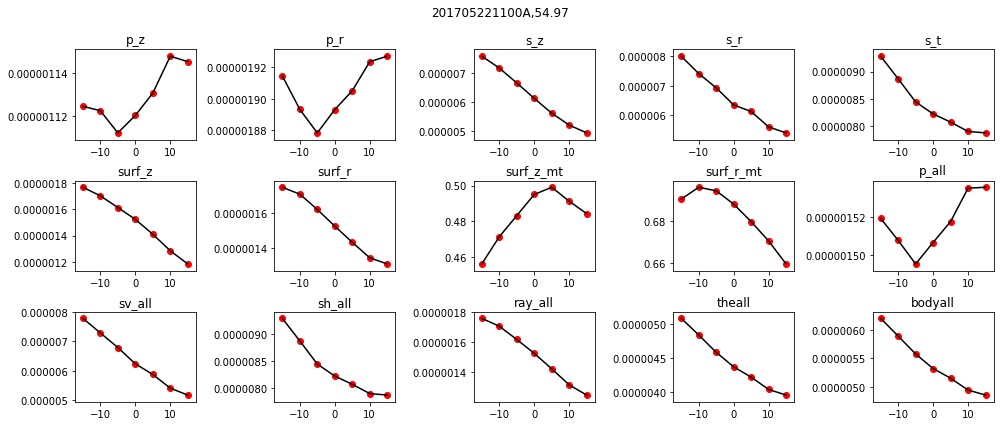

['d-15(39.97)', 'd-10(44.97)', 'd-5(49.97)', 'd0(54.97)', 'd5(59.97)', 'd10(64.97)', 'd15(69.97)']


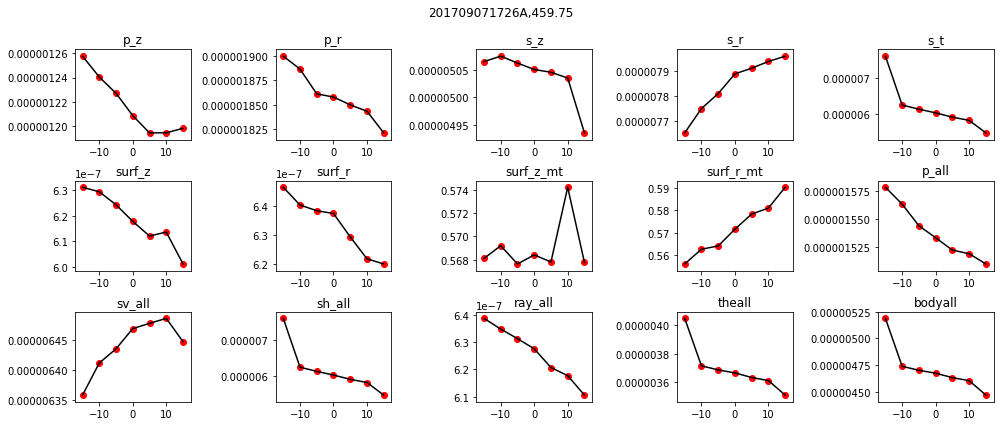

['d-15(444.75)', 'd-10(449.75)', 'd-5(454.75)', 'd0(459.75)', 'd5(464.75)', 'd10(469.75)', 'd15(474.75)']


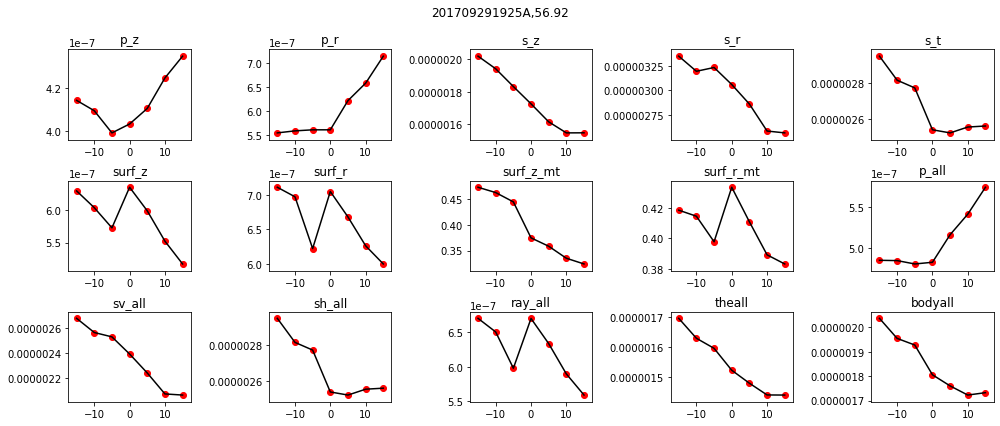

['d-15(41.92)', 'd-10(46.92)', 'd-5(51.92)', 'd0(56.92)', 'd5(61.92)', 'd10(66.92)', 'd15(71.92)']


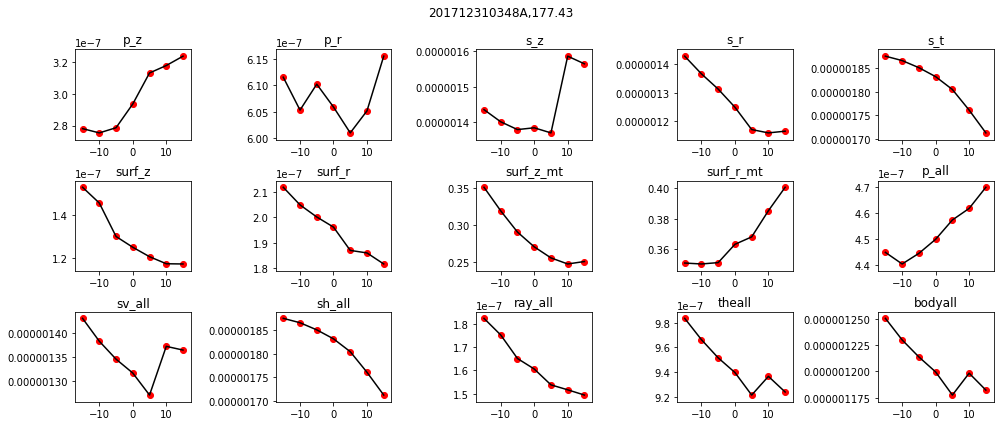

['d-15(162.43)', 'd-10(167.43)', 'd-5(172.43)', 'd0(177.43)', 'd5(182.43)', 'd10(187.43)', 'd15(192.43)']


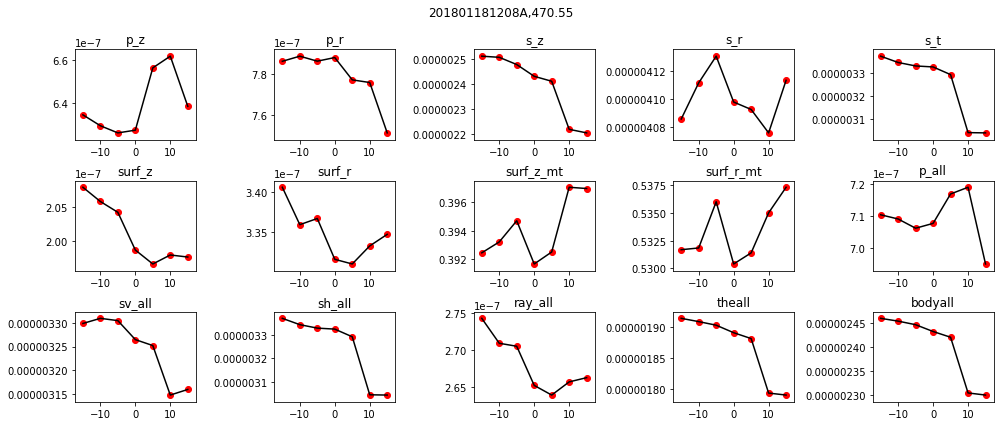

['d-15(455.55)', 'd-10(460.55)', 'd-5(465.55)', 'd0(470.55)', 'd5(475.55)', 'd10(480.55)', 'd15(485.55)']


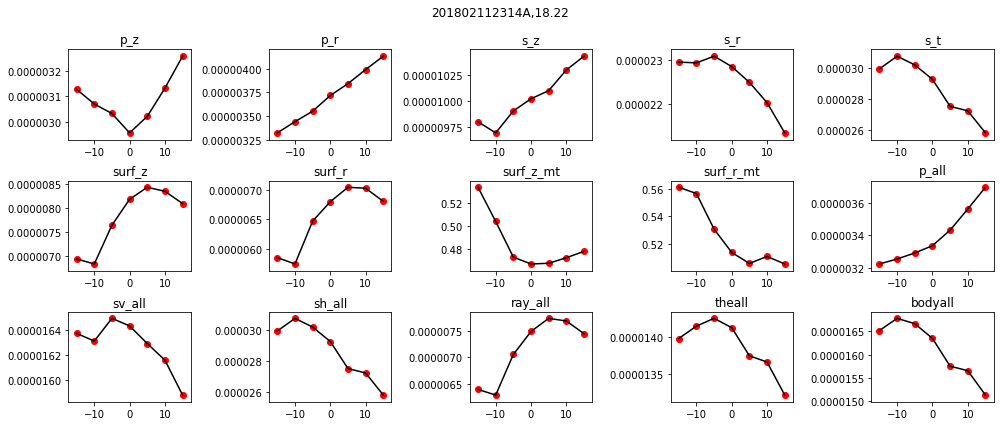

['d-15(5.0)', 'd-10(9.406666666666666)', 'd-5(13.813333333333333)', 'd0(18.22)', 'd5(23.22)', 'd10(28.22)', 'd15(33.22)']


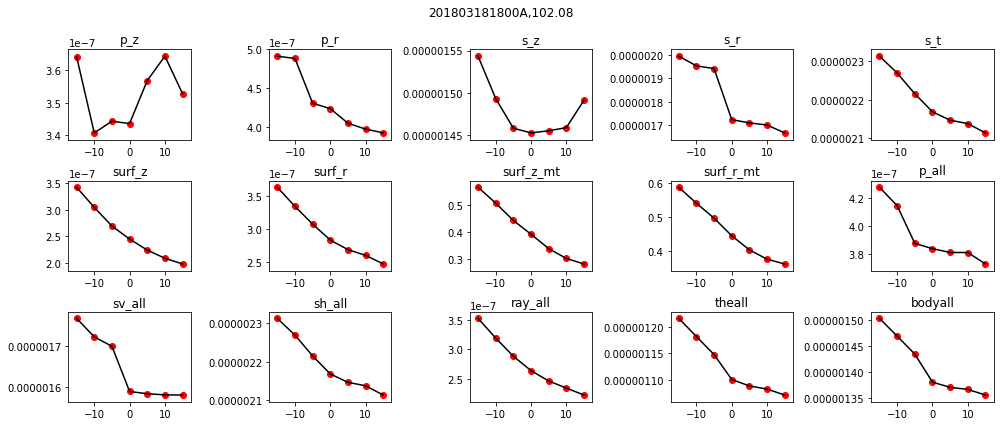

['d-15(87.08)', 'd-10(92.08)', 'd-5(97.08)', 'd0(102.08)', 'd5(107.08)', 'd10(112.08)', 'd15(117.08)']


In [8]:
for gcmtid in gcmtid_keys:
    plot_single_figure(gcmtid,"preprocessed_20s_to_120s")